# **Assignment 3: Model Interpretability**

Name: Jeel Kanzaria

NUID : 002652655

# **Abstract:**

In this notebook i have used the dataset that describes world population(yearly %change, median age, fertility rate, global rank) of all the continenst and countries from 1955-2020. Each time period records the change 5 years apart. The main aim of the notebook is to check the quality of data and determine which features are important.

The dataset consist of 13 columns:

Continent-Continent of the population.     
Country-Country of the population.      
Year- Year range of the population from 1955-2020.     
Population- Population of each countries in given year.     
Yearly %Change- Yearly percentage change of the population.      
Yearly Change-Yearly change of the population.      
Migrants(net)-Net migrants yearwise.      
MedianAge-Median age pf the world population.     
Fertility Rate-Rate of the world population.      
UrbanPop%-Percenatge of the urban population.      
UrbanPopulation.     
Country%OfWolrdPop-Percentage of the country of world population.   
GlobalRank- Globalrank of each country continentwise.     

In this assignment with the help of Pycaret, we will be able to do model interpretability on linear model and tree based model using SHAP analysis, Patial Depency Plot Analysis and LIME analysis.

# **Installation of dependent libraries required for pycaret**

In [ ]:
#installing dependencies
!pip install pycaret  

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 481.8/481.8 KB 8.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 212.2/212.2 KB 5.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 105.8/105.8 KB 6.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 150.0/150.0 KB 11.0 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 298.0/298.0 KB 14.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 46.4/46.4 KB 2.4 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 43.8/43.8 KB 4.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.9/1.9 MB 47.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 81.2/81.2 KB 3.1 MB/s eta 0:00:00
 

In [ ]:
#Installing shap
!pip install shap

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 572.4/572.4 KB 10.4 MB/s eta 0:00:00


In [ ]:
# Importing the libraries which are used in this code
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# **Import Data from CSV Files & Display the contents**

In [ ]:
#Reading the dataset
url = r'https://github.com/jeelkan/DSE/blob/main/population.csv?raw=true'
wp_df = pd.read_csv(url,index_col=0)

In [ ]:
#viewing first 5 rows of the dataset
wp_df.head()

,Continent,Country,Year,Population,Yearly%Change,YearlyChange,Migrants(net),MedianAge,FertilityRate,UrbanPop%,UrbanPopulation,Country%OfWorldPop,GlobalRank
0,Asia,Afghanistan,1955,8270991,1.30,103775,-4000,19.2,7.45,7.1,587818,0.30,48
1,Asia,Afghanistan,1960,8996973,1.70,145196,-4000,18.8,7.45,8.4,755797,0.30,48
2,Asia,Afghanistan,1965,9956320,2.05,191869,-4000,18.4,7.45,9.9,984350,0.30,48
3,Asia,Afghanistan,1970,11173642,2.33,243464,-4000,17.9,7.45,11.6,1295433,0.30,48
4,Asia,Afghanistan,1975,12689160,2.58,303104,-4000,17.3,7.45,13.5,1717422,0.31,48


In [ ]:
# Displaying data present in dataframe

wp_df

,Continent,Country,Year,Population,Yearly%Change,YearlyChange,Migrants(net),MedianAge,FertilityRate,UrbanPop%,UrbanPopulation,Country%OfWorldPop,GlobalRank
0,Asia,Afghanistan,1955,8270991,1.30,103775,-4000,19.2,7.45,7.1,587818,0.30,48
1,Asia,Afghanistan,1960,8996973,1.70,145196,-4000,18.8,7.45,8.4,755797,0.30,48
2,Asia,Afghanistan,1965,9956320,2.05,191869,-4000,18.4,7.45,9.9,984350,0.30,48
3,Asia,Afghanistan,1970,11173642,2.33,243464,-4000,17.9,7.45,11.6,1295433,0.30,48
4,Asia,Afghanistan,1975,12689160,2.58,303104,-4000,17.3,7.45,13.5,1717422,0.31,48
...,...,...,...,...,...,...,...,...,...,...,...,...,...
4225,Africa,Zimbabwe,2016,14030331,1.56,215702,-116858,18.5,3.99,37.2,5215894,0.19,74
4226,Africa,Zimbabwe,2017,14236595,1.47,206264,-116858,18.5,3.99,37.4,5328766,0.19,74
4227,Africa,Zimbabwe,2018,14438802,1.42,202207,-116858,18.5,3.99,37.7,5447513,0.19,74
4228,Africa,Zimbabwe,2019,14645468,1.43,206666,-116858,18.5,3.99,38.0,5571525,0.19,74


In [ ]:
# Displaying info regarding the columns and datatypes

wp_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 4230 entries, 0 to 4229
Data columns (total 13 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   Continent           4230 non-null   object 
 1   Country             4230 non-null   object 
 2   Year                4230 non-null   int64  
 3   Population          4230 non-null   int64  
 4   Yearly%Change       4230 non-null   float64
 5   YearlyChange        4230 non-null   int64  
 6   Migrants(net)       4230 non-null   int64  
 7   MedianAge           4230 non-null   float64
 8   FertilityRate       4230 non-null   float64
 9   UrbanPop%           4230 non-null   float64
 10  UrbanPopulation     4230 non-null   int64  
 11  Country%OfWorldPop  4230 non-null   float64
 12  GlobalRank          4230 non-null   int64  
dtypes: float64(5), int64(6), object(2)
memory usage: 462.7+ KB


In [ ]:
# Checking if there are null values in the dataframe

wp_df.isnull().sum()

Continent             0
Country               0
Year                  0
Population            0
Yearly%Change         0
YearlyChange          0
Migrants(net)         0
MedianAge             0
FertilityRate         0
UrbanPop%             0
UrbanPopulation       0
Country%OfWorldPop    0
GlobalRank            0
dtype: int64

No data is missing from the dataset which means that it is not required to impute or remove null values from the dataset.

In [ ]:
wp_df.describe()

,Year,Population,Yearly%Change,YearlyChange,Migrants(net),MedianAge,FertilityRate,UrbanPop%,UrbanPopulation,Country%OfWorldPop,GlobalRank
count,4230.000000,4.230000e+03,4230.000000,4.230000e+03,4.230000e+03,4230.000000,4230.000000,4230.000000,4.230000e+03,4230.000000,4230.000000
mean,1994.166667,2.423329e+07,1.659778,3.271283e+05,-4.121513e+00,21.789243,3.324785,52.558869,1.167059e+07,0.425392,117.183452
std,21.723653,1.063217e+08,1.650514,1.329164e+06,9.808264e+04,11.751355,2.289232,26.768449,4.665141e+07,1.800249,68.058075
min,1955.000000,6.440000e+02,-12.930000,-6.730240e+05,-1.077397e+06,0.000000,0.000000,0.000000,0.000000e+00,0.000000,1.000000
25%,1975.000000,2.733908e+05,0.610000,1.201750e+03,-8.997000e+03,17.200000,1.690000,31.200000,1.148200e+05,0.000000,58.000000
50%,1997.500000,3.603262e+06,1.530000,3.730850e+04,0.000000e+00,20.700000,2.790000,52.500000,1.479994e+06,0.070000,117.000000
75%,2016.000000,1.276953e+07,2.590000,2.038582e+05,2.225250e+03,30.000000,5.347500,74.300000,6.588019e+06,0.250000,176.000000
max,2020.000000,1.439324e+09,23.300000,2.067648e+07,1.771991e+06,48.400000,8.800000,100.000000,8.750759e+08,22.700000,235.000000


This table shows summary statistics for a dataset with 4230 observations and 11 variables.

The variables are: Year,Population,Yearly%Change,YearlyChange,Migrants(net),MedianAge,FertilityRate,UrbanPop%,UrbanPopulation,Country%OfWorldPop and GlobalRank.

The "count" row shows the number of observations for each variable, while the "mean" row shows the average value of each variable.

The "std" row shows the standard deviation of each variable, which is a measure of how much the values vary from the mean.

The "min" and "max" rows show the smallest and largest values observed for each variable.

The "25%", "50%", and "75%" rows show the values at the 25th, 50th, and 75th percentiles of the distribution, respectively.

These percentiles divide the observations into quarters, with the 25th percentile being the value below which 25% of the observations fall, and so on.

# **Visualization**

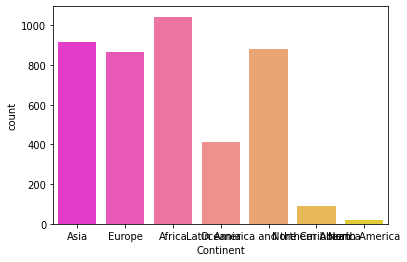

In [ ]:
#Plotting the countplot
import seaborn as sns
sns.countplot(x=wp_df['Continent'],palette='spring');

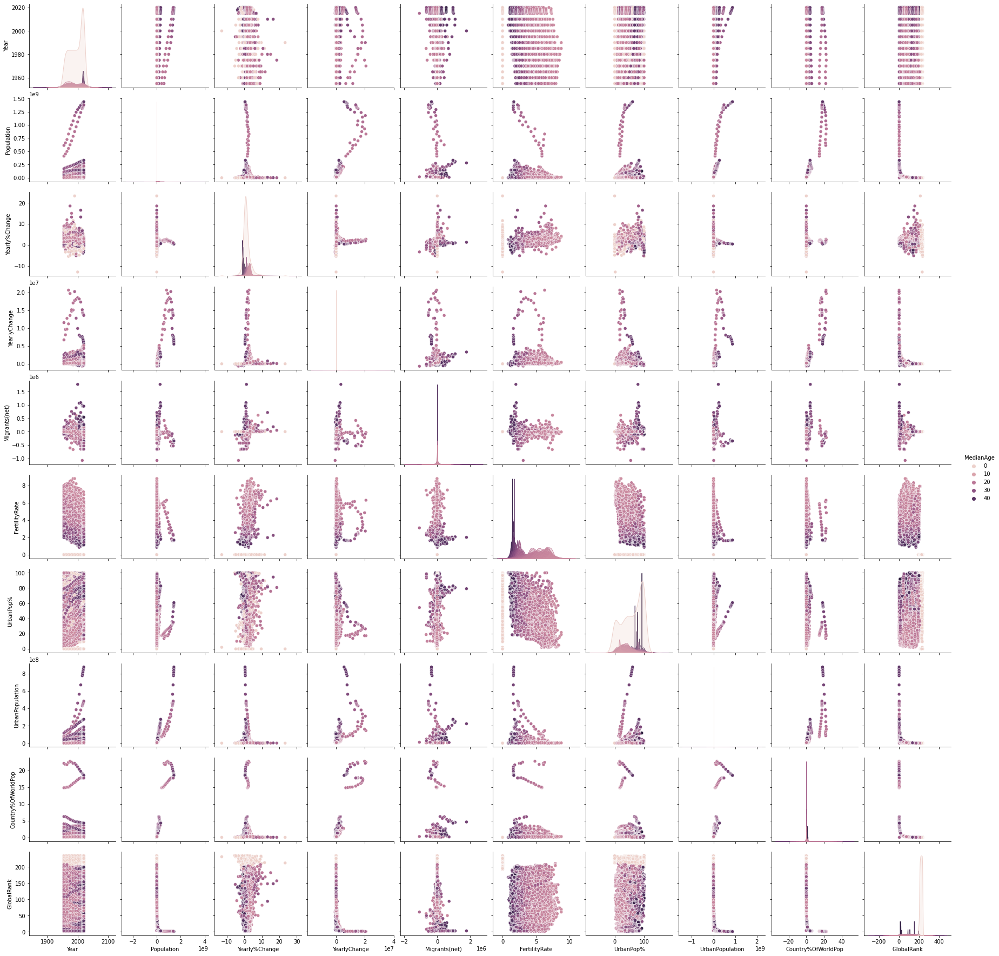

In [ ]:
#pairplot to check collinearity
#Plotting the pairplot for the target column
sns.pairplot(wp_df,hue='MedianAge');

**Interpreting PairPlot**

A pair plot is a graphical representation of pairwise relationships between variables in a dataset. It displays scatter plots for each pair of variables
Distribution of variables: The histograms show the distribution of each variable. If a variable has a normal distribution, the histogram will be bell-shaped. If a variable is skewed, the histogram will be asymmetric. The pair plot can help identify variables that have non-normal distributions or outliers.
Potential predictors: By examining the scatter plots, you can identify variables that may be potential predictors for a statistical model. Variables that have a strong correlation with the target variable may be good predictors for the model.
From the pairplot above we can see that all the variables are independent of wach other without correlation.

In [ ]:
#Separating numeric columns from the dataset for plotting box plot

wp_df_numeric = wp_df[['Population','Yearly%Change','YearlyChange','Migrants(net)','MedianAge','FertilityRate','UrbanPop%','UrbanPopulation','Country%OfWorldPop','GlobalRank']]
wp_df_numeric.head()

,Population,Yearly%Change,YearlyChange,Migrants(net),MedianAge,FertilityRate,UrbanPop%,UrbanPopulation,Country%OfWorldPop,GlobalRank
0,8270991,1.30,103775,-4000,19.2,7.45,7.1,587818,0.30,48
1,8996973,1.70,145196,-4000,18.8,7.45,8.4,755797,0.30,48
2,9956320,2.05,191869,-4000,18.4,7.45,9.9,984350,0.30,48
3,11173642,2.33,243464,-4000,17.9,7.45,11.6,1295433,0.30,48
4,12689160,2.58,303104,-4000,17.3,7.45,13.5,1717422,0.31,48


<Axes: >

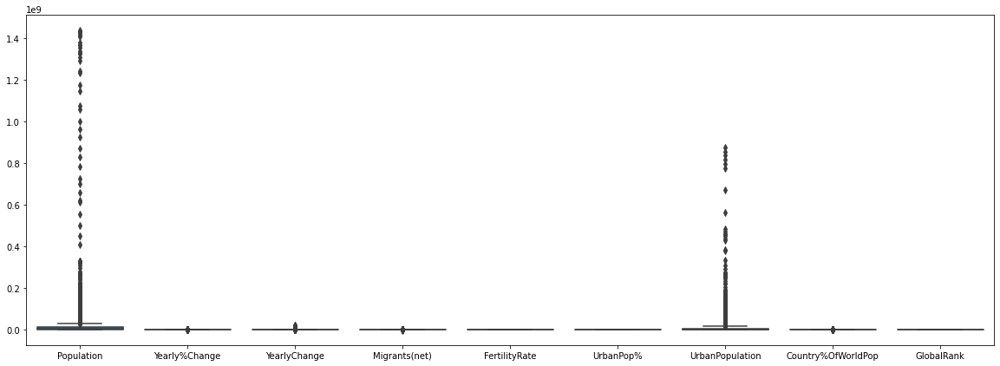

In [ ]:
# Plotting Box plot for numeric data

plt.figure(figsize=(20,7))
sns.boxplot(data=wp_df_numeric.drop(['MedianAge'],axis=1))

It is hard to visualize and read data as they are not in same ranges, I'll try to normalize the data for better understanding and visualization. I will also help later to get normalized coefficients when building the model. So need to normalize each column so that they are in same range.

In [ ]:
# Normalizing the data in the each column because the value is too high when compared to other independent variable

from sklearn import preprocessing

for column_name in ['Population','Yearly%Change','YearlyChange','Migrants(net)','FertilityRate','UrbanPop%','UrbanPopulation','Country%OfWorldPop','GlobalRank']:
    # Create x to store scaled values as floats
    x = wp_df[[column_name]].values.astype(float)

    # Preparing for normalizing
    min_max_scaler = preprocessing.MinMaxScaler()

    # Transform the data to fit minmax processor
    x_scaled = min_max_scaler.fit_transform(x)

    # Run the normalizer on the dataframe
    wp_df_numeric[[column_name]] = pd.DataFrame(x_scaled)

<ipython-input-15-e5a93cc83a68>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  wp_df_numeric[[column_name]] = pd.DataFrame(x_scaled)
<ipython-input-15-e5a93cc83a68>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  wp_df_numeric[[column_name]] = pd.DataFrame(x_scaled)
<ipython-input-15-e5a93cc83a68>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.py

<Axes: >

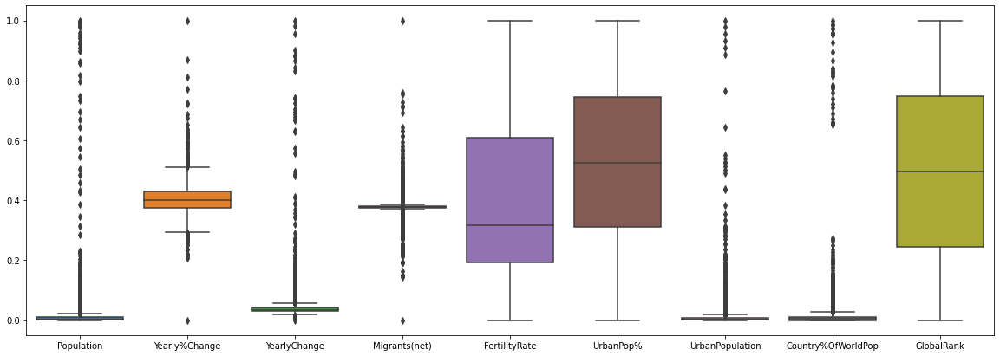

In [ ]:
# Plotting box plot after normalization

plt.figure(figsize=(20,7))
sns.boxplot(data=wp_df_numeric.drop(['MedianAge'],axis=1))

<Axes: >

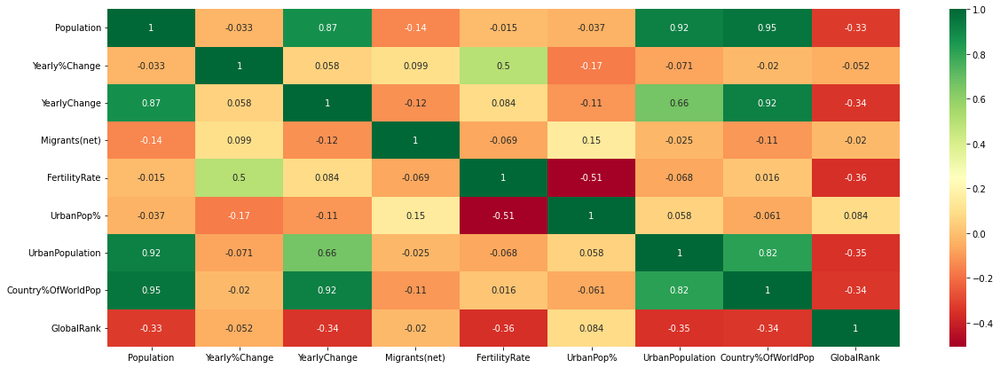

In [ ]:
#Plotting heat map of the correlation
plt.figure(figsize=(20,7))
sns.heatmap(wp_df_numeric.drop(['MedianAge'],axis=1).corr(), annot=True, cmap='RdYlGn')

Above is a graphical representation of the correlation between different features in the dataset. The heatmap displays a matrix of colors that represent the strength of the correlation between pairs of variables.

We can calculate the correlation between pairs of variables using a correlation coefficient, such as the Pearson correlation coefficient. This coefficient measures the linear relationship between two variables, with values ranging from -1 (perfect negative correlation) to 1 (perfect positive correlation). A value of 0 indicates no correlation

The above heatmap displays the correlation coefficients as colors in a matrix, with each variable plotted both on the x and y axis. The color of each cell in the matrix indicates the strength of the correlation between the corresponding pair of variables, with a color scale ranging from low to high .

From the Above Matrix we can conclude a few things

Population and Country%OfWorldPop are highly correlated
UrbanPopulation dna Population is highly correlated.
YearlyChange and Population is highly correlated.

In [ ]:
#checking the correlation between the numeric features in the data

wp_df_numeric.drop(['MedianAge'],axis=1).corr()

,Population,Yearly%Change,YearlyChange,Migrants(net),FertilityRate,UrbanPop%,UrbanPopulation,Country%OfWorldPop,GlobalRank
Population,1.000000,-0.033177,0.870742,-0.142915,-0.014700,-0.037494,0.920392,0.953910,-0.326906
Yearly%Change,-0.033177,1.000000,0.058471,0.098813,0.497521,-0.166117,-0.070963,-0.019832,-0.052321
YearlyChange,0.870742,0.058471,1.000000,-0.119322,0.083537,-0.109838,0.660398,0.918017,-0.343914
Migrants(net),-0.142915,0.098813,-0.119322,1.000000,-0.069266,0.148223,-0.025389,-0.106216,-0.019669
FertilityRate,-0.014700,0.497521,0.083537,-0.069266,1.000000,-0.506359,-0.067777,0.016339,-0.358958
UrbanPop%,-0.037494,-0.166117,-0.109838,0.148223,-0.506359,1.000000,0.057543,-0.061107,0.083890
UrbanPopulation,0.920392,-0.070963,0.660398,-0.025389,-0.067777,0.057543,1.000000,0.816415,-0.351308
Country%OfWorldPop,0.953910,-0.019832,0.918017,-0.106216,0.016339,-0.061107,0.816415,1.000000,-0.339929
GlobalRank,-0.326906,-0.052321,-0.343914,-0.019669,-0.358958,0.083890,-0.351308,-0.339929,1.000000


#**Removing outliers**

In [ ]:
def remove_outliers(data):
    z_scores = (data - data.mean()) / data.std()
    df_without_outliers = data[np.abs(z_scores) < 3]
    return df_without_outliers

In [ ]:
df_without_outliers = remove_outliers(wp_df_numeric)

<Axes: >

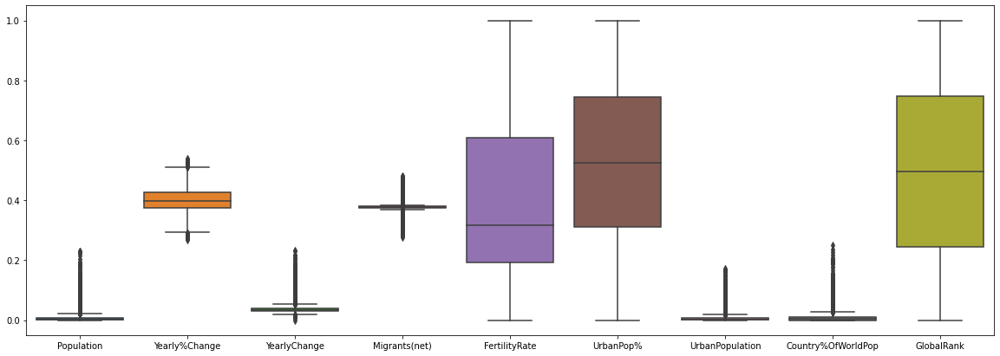

In [ ]:
plt.figure(figsize=(20,7))
sns.boxplot(data=df_without_outliers.drop(['MedianAge'],axis=1))

<Axes: >

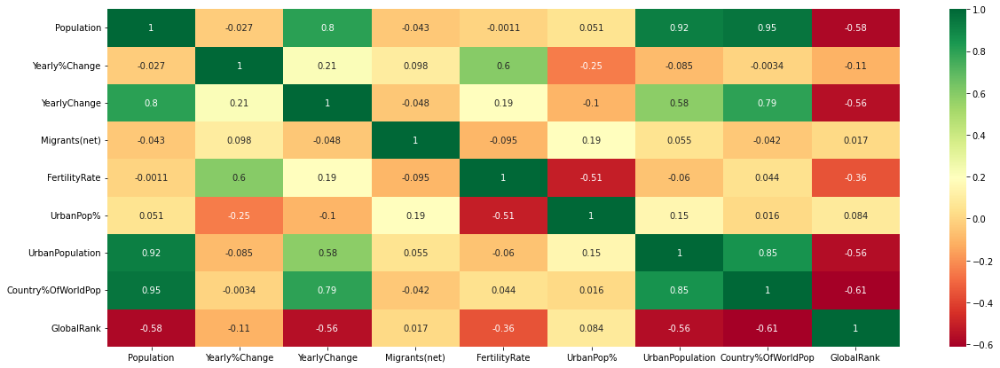

In [ ]:
#Plotting heat map of the correlation
plt.figure(figsize=(20,7))
sns.heatmap(df_without_outliers.drop(['MedianAge'],axis=1).corr(), annot=True, cmap='RdYlGn')

In [ ]:
#checking the correlation between the numeric features in the data
df_without_outliers.drop(['MedianAge'],axis=1).corr()

,Population,Yearly%Change,YearlyChange,Migrants(net),FertilityRate,UrbanPop%,UrbanPopulation,Country%OfWorldPop,GlobalRank
Population,1.000000,-0.026566,0.802619,-0.042787,-0.001078,0.050918,0.919452,0.949690,-0.582216
Yearly%Change,-0.026566,1.000000,0.214545,0.097991,0.596885,-0.252230,-0.085268,-0.003401,-0.112732
YearlyChange,0.802619,0.214545,1.000000,-0.047937,0.192992,-0.103214,0.582079,0.794768,-0.555920
Migrants(net),-0.042787,0.097991,-0.047937,1.000000,-0.095295,0.191262,0.055268,-0.041670,0.016545
FertilityRate,-0.001078,0.596885,0.192992,-0.095295,1.000000,-0.506359,-0.060178,0.043565,-0.358958
UrbanPop%,0.050918,-0.252230,-0.103214,0.191262,-0.506359,1.000000,0.148170,0.016391,0.083890
UrbanPopulation,0.919452,-0.085268,0.582079,0.055268,-0.060178,0.148170,1.000000,0.850199,-0.562610
Country%OfWorldPop,0.949690,-0.003401,0.794768,-0.041670,0.043565,0.016391,0.850199,1.000000,-0.611043
GlobalRank,-0.582216,-0.112732,-0.555920,0.016545,-0.358958,0.083890,-0.562610,-0.611043,1.000000


As we can see here, after removing outliers, the correlation value is still almost same as previous one and there isn't much difference observed.



In [ ]:
from sklearn.preprocessing import LabelEncoder, OneHotEncoder

# **Linear Regression**

In [ ]:
# Using one hot encoding to convert categorical data into numeric data

encoder = OneHotEncoder()
encoded_data = encoder.fit_transform(wp_df[['Continent','Country']])

encoded_df = pd.DataFrame(encoded_data.toarray(), 
columns=encoder.get_feature_names_out(['Continent','Country']))

print(encoded_df)

      Continent_Africa  Continent_Asia  Continent_Europe  \
0                  0.0             1.0               0.0   
1                  0.0             1.0               0.0   
2                  0.0             1.0               0.0   
3                  0.0             1.0               0.0   
4                  0.0             1.0               0.0   
...                ...             ...               ...   
4225               1.0             0.0               0.0   
4226               1.0             0.0               0.0   
4227               1.0             0.0               0.0   
4228               1.0             0.0               0.0   
4229               1.0             0.0               0.0   

      Continent_Latin America and the Caribbean  Continent_North America  \
0                                           0.0                      0.0   
1                                           0.0                      0.0   
2                                           0.0    

In [ ]:
# Concatinating encoded data set with other numerical data with outliers in the data set

wp_df_new = pd.concat([wp_df_numeric,encoded_df], axis=1)
wp_df_new

,Population,Yearly%Change,YearlyChange,Migrants(net),MedianAge,FertilityRate,UrbanPop%,UrbanPopulation,Country%OfWorldPop,GlobalRank,...,Country_Uruguay,Country_Uzbekistan,Country_Vanuatu,Country_Venezuela,Country_Vietnam,Country_Wallis & Futuna,Country_Western Sahara,Country_Yemen,Country_Zambia,Country_Zimbabwe
0,0.005746,0.392768,0.036385,0.376711,19.2,0.846591,0.071,0.000672,0.013216,0.200855,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.006250,0.403809,0.038325,0.376711,18.8,0.846591,0.084,0.000864,0.013216,0.200855,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.006917,0.413470,0.040511,0.376711,18.4,0.846591,0.099,0.001125,0.013216,0.200855,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.007763,0.421198,0.042928,0.376711,17.9,0.846591,0.116,0.001480,0.013216,0.200855,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.008816,0.428098,0.045721,0.376711,17.3,0.846591,0.135,0.001963,0.013656,0.200855,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4225,0.009747,0.399945,0.041627,0.337104,18.5,0.453409,0.372,0.005961,0.008370,0.311966,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
4226,0.009891,0.397461,0.041185,0.337104,18.5,0.453409,0.374,0.006089,0.008370,0.311966,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
4227,0.010031,0.396081,0.040995,0.337104,18.5,0.453409,0.377,0.006225,0.008370,0.311966,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
4228,0.010175,0.396357,0.041204,0.337104,18.5,0.453409,0.380,0.006367,0.008370,0.311966,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0


In [ ]:
wp_df1 = wp_df_new.drop(['MedianAge'],axis=1)

In [ ]:
# Separating independent variable and dependent variable in X and y dataframes
from sklearn.model_selection import  train_test_split

X = wp_df_new.drop(columns =['MedianAge'], axis=1).values
y= wp_df_new['MedianAge'].values

In [ ]:
X

array([[0.005746  , 0.39276842, 0.03638486, ..., 0.        , 0.        ,
        0.        ],
       [0.00625039, 0.403809  , 0.038325  , ..., 0.        , 0.        ,
        0.        ],
       [0.00691692, 0.4134695 , 0.04051114, ..., 0.        , 0.        ,
        0.        ],
       ...,
       [0.01003121, 0.3960806 , 0.04099537, ..., 0.        , 0.        ,
        1.        ],
       [0.0101748 , 0.39635661, 0.04120423, ..., 0.        , 0.        ,
        1.        ],
       [0.01032588, 0.39773668, 0.04170962, ..., 0.        , 0.        ,
        1.        ]])

In [ ]:
y

array([19.2, 18.8, 18.4, ..., 18.5, 18.5, 18.7])

In [ ]:
#Spliting data into Training dataset 80% and testing dataset 20%

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0)

In [ ]:
X_train

array([[1.35817313e-04, 3.67927132e-01, 3.15604916e-02, ...,
        0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
       [5.02502478e-02, 3.91940381e-01, 7.29631768e-02, ...,
        0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
       [5.98945560e-03, 4.38586807e-01, 4.24878155e-02, ...,
        0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
       ...,
       [1.09079050e-07, 3.84764008e-01, 3.15244721e-02, ...,
        0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
       [6.96577424e-06, 3.82279879e-01, 3.15286408e-02, ...,
        0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
       [1.32612751e-01, 4.29754347e-01, 2.61646626e-01, ...,
        0.00000000e+00, 0.00000000e+00, 0.00000000e+00]])

In [ ]:
X_test

array([[1.50504772e-04, 4.22301960e-01, 3.17486927e-02, ...,
        0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
       [1.04288416e-02, 4.02704941e-01, 4.26275846e-02, ...,
        0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
       [3.98895833e-05, 3.72343362e-01, 3.15392265e-02, ...,
        0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
       ...,
       [3.88028920e-04, 3.87524151e-01, 3.18052279e-02, ...,
        0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
       [1.43413175e-03, 4.35274634e-01, 3.41916060e-02, ...,
        0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
       [5.47824378e-03, 3.80071764e-01, 3.45603733e-02, ...,
        0.00000000e+00, 0.00000000e+00, 0.00000000e+00]])

In [ ]:
y_train

array([21.1, 28.3, 17.7, ...,  0. ,  0. , 17.9])

In [ ]:
y_test

array([27.2, 25. ,  0. , 18.1, 16.5,  0. , 33.9, 22.1, 25.5, 20.9, 17.1,
       21.7,  0. , 22. , 17.8, 32.4, 22.4, 31.6, 34.9, 42.3, 25.5,  0. ,
       29.9, 19.6, 23.1, 31.8, 37.8, 35.7, 22.4, 23.2, 22. , 21.3, 16.9,
       21.9, 17.1, 37.3, 17.2, 23.7, 30.5,  0. , 28.5, 34.6, 36.1,  0. ,
       43. ,  0. , 28.8, 26.6,  0. , 43. , 39.4, 18.4, 34.1, 18.2, 17.1,
       19.7, 20.2, 23.1, 20.2, 24.2, 32.8, 18. , 18.2, 20.3,  0. , 17. ,
       16. ,  0. , 24. , 20.7, 26. , 18.5, 21.1, 37.3, 20.7, 34.8,  0. ,
       20.3, 16.1, 37.2, 31.8, 18.9, 19.8, 18. , 33. , 35. , 38.4, 17.2,
       24.8, 26.3, 37.6, 23.4, 18.8, 35.2,  0. ,  0. , 18.4,  0. ,  0. ,
       29.3, 20.7, 26.6, 28.7, 43.3,  0. , 16.3, 15.9, 18.8,  0. , 21.6,
        0. , 27.5, 33.9, 17.3, 40.2, 17.7, 33.2, 19.1, 37. , 19.7, 19.5,
       18. ,  0. , 29.2, 17.9, 28.9, 16.9, 16.6, 28.1,  0. , 16.4,  0. ,
       17.2,  0. , 19.6, 38. , 24.8,  0. ,  0. , 19.6, 31.4, 18.6, 17. ,
       22.2, 16.3, 42.9,  0. , 29.6, 28.2, 41.6, 15

# **Fitting a Linear Model with train dataset**

In [ ]:
#Performing linear regression on training data

from sklearn import datasets, linear_model, metrics
reg = linear_model.LinearRegression()
logmodel=reg.fit(X_train, y_train)
print(logmodel)

LinearRegression()


In [ ]:
y_pred = logmodel.predict(X_test)
y_pred.shape

(846,)

In [ ]:
X_test_new = pd.DataFrame(X_test,columns = wp_df1.columns)
X_train_new = pd.DataFrame(X_train,columns = wp_df1.columns)

In [ ]:
linear_odds = reg.coef_
pd.DataFrame(linear_odds, 
             X_train_new.columns, 
             columns=['coef'])\
            .sort_values(by='coef', ascending=False)

,coef
Continent_North America,1.175195e+14
Continent_Oceania,4.787176e+13
Country_Nigeria,1.703149e+13
Country_Egypt,1.703149e+13
Country_Ethiopia,1.703149e+13
...,...
Country_Tuvalu,-5.824656e+13
Country_Tokelau,-5.824656e+13
Country_Nauru,-5.824656e+13
Country_Niue,-5.824656e+13


Here we are mapping the coefficient to their respective variable

In [ ]:
#Using OLS for finding the p value to check the significant features
import statsmodels.api as sm  

model = sm.OLS(y,X).fit()
coef_table = pd.DataFrame({'feature': wp_df1.columns, 'coef': model.params})
print(coef_table)

                     feature       coef
0                 Population  11.034692
1              Yearly%Change  -9.275089
2               YearlyChange  -4.666803
3              Migrants(net)  15.216555
4              FertilityRate -22.476425
..                       ...        ...
246  Country_Wallis & Futuna -28.039322
247   Country_Western Sahara -14.682351
248            Country_Yemen   2.994463
249           Country_Zambia   4.314905
250         Country_Zimbabwe   3.919917

[251 rows x 2 columns]


In [ ]:
from statsmodels.formula.api import ols

#fit multiple linear regression model
model = ols('MedianAge~Year + Population + YearlyChange + FertilityRate + UrbanPopulation + GlobalRank', data=wp_df).fit()

#view model summary
print(model.summary())

                            OLS Regression Results                            
Dep. Variable:              MedianAge   R-squared:                       0.331
Model:                            OLS   Adj. R-squared:                  0.330
Method:                 Least Squares   F-statistic:                     348.8
Date:                Sat, 25 Mar 2023   Prob (F-statistic):               0.00
Time:                        20:05:25   Log-Likelihood:                -15573.
No. Observations:                4230   AIC:                         3.116e+04
Df Residuals:                    4223   BIC:                         3.120e+04
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
                      coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------
Intercept        -203.6721     15.173    -

# **Interpreting Regression Co-efficients**
**Model Co-efficients**

The positive or negative value of a co-eficient tells us if there is a positve or a negtive correlationship between the target and predictors. A positive value indicates that the value of target increases if the value of co-efficient increases and vice-versa. Whereas the negative values indicates that the value of target increases if the value of co-efficient decreases and vice versa.

As seen in the co-efficient coloumn in the above table

Value for the variable Year is highest = 0.11
Followed by Population = 1.4434
High absolute values of co-efficients can be used to get an idea of the importance of variables in a linear regression. Here, as stated above Population and Year seems to be the most important variables to predict target i.e. Mediand Age.

P-Values

If the p-value is 0.05 or lower, the result is trumpeted as significant, but if it is higher than 0.05, the result is non-significant

Skew and Kurtosis

Skewness tells us the amount and direction of skew(Departure from the central axis) and Kurtosis tells us how tall and sharp the central peak is. The optimum value for these two measures is 0, in our case we have a value for Skew and Kurtosis as 0.20, 2.38 respectively.

Durbin-Watson

The Durbin-Watson test is a statistical test to detect auto-correlation in the residuals of a regression analysis. Its range is 0 to 4.

Value of 2 indicates that no auto correlation is detected
Value between 0 to 2 indicates that there is positive auto correlation detected
Value between 2 to 4 indicates that there is negatibe auto correlation detected
Our model has a DW score of 0.126 which could be interpreted as a positive auto-correlation in the residuals of regression.

Jarque-Bera Test

The JB test is known as the test of Normality, irrespective if the data has skew or kurtosis. If it is far from zero, it signals the data do not have a normal distribution. Our JB value is 95.818 which again re-inforces the interpretation we got from Skew and Kurtosis.

# **SHAP Analysis For Linear Model**

In [ ]:
#importing libraries

import shap

# **SHAP Summary For Linear Model**

No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


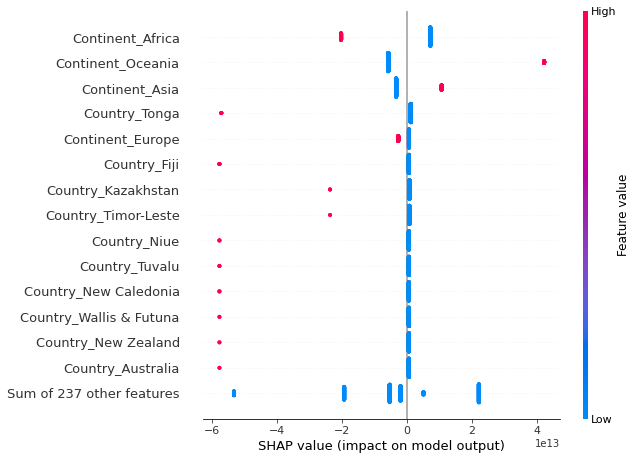

In [ ]:
lg_ex = shap.Explainer(logmodel, X_train)
shap_values_lg = lg_ex(X_test_new)
shap.plots.beeswarm(shap_values_lg, max_display=15)

From the SHAP summary diagram, we can interpret a few conclusions -

All the features are listed as per their importance in making the prediction, that is Continent Africa is more significant followed by other continents, and so on. 

The position on the SHAP value axis indicates the impact the feature has on the prediction either positive or negative. That is, the more the data point is away from the 0.0 shap value - the more its impact is. As we can see Continents has the most impact. The color of the dot represents (Red - High, Blue - Low) the impact of the value on the result. As we can see the distribution of red points in the Continents feature is far more spread than the blue points. From this visual, we can interpret that the MedianAge vastly increases as the amount of Population increases. It doesn't have much impact if the content is low i.e. between the shap value of 0.4 to 0.6 the blue data points are pretty concentrated. Let us analyze the distribution of SHAP values of this feature. As seen in the SHAP plot we can see that extreme values on both ends can have a significant effect on the MedianAge.
The advantage of SHAP analysis over normal feature importance is that we could visualize how the feature is affecting the target at different values. The standard methods tend to overestimate the importance of continuous or high-cardinality categorical variables.



# **Interpreting SHAP Feature Importance Plot for Linear model**

The idea behind SHAP feature importance is simple: Features with large absolute Shapley values are important. Since we want global importance, we average the absolute Shapley values per feature across the data. Next, we sort the features by decreasing importance and plot them.

The following plots are

SHAP feature importance for a linear model


For the linear model, Continents is most important feature when we consider the average of SHAP values to calculate feature importance.

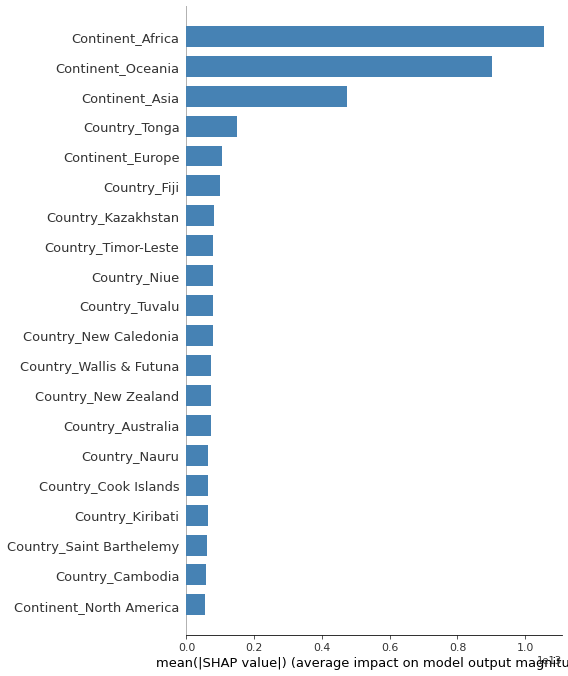

In [ ]:
#SHAP Summary Plot
shap.summary_plot(shap_values_lg, X_train, plot_type="bar", color='steelblue')

# **Interpreting Waterfall SHAP visualization For Linear Model**

Let's consider the same sample (sample_ind = 18)
Notice the value of Continent Africa in the waterfall model is the same as what we have in SHAP partial dependence plot. It says that f(x) = 34.58 .The waterfall model explains how we got the expected output, and which features contributed to what. The below graph shows that Continent_Africa has the biggest and most positive impact in increasing the Median Age for this specific sample. Followed by Country_Latvia had a negative impact and it bought the value down, and so on. Using this model we can visually interpret why exactly this specific sample is giving an output of 34.58.

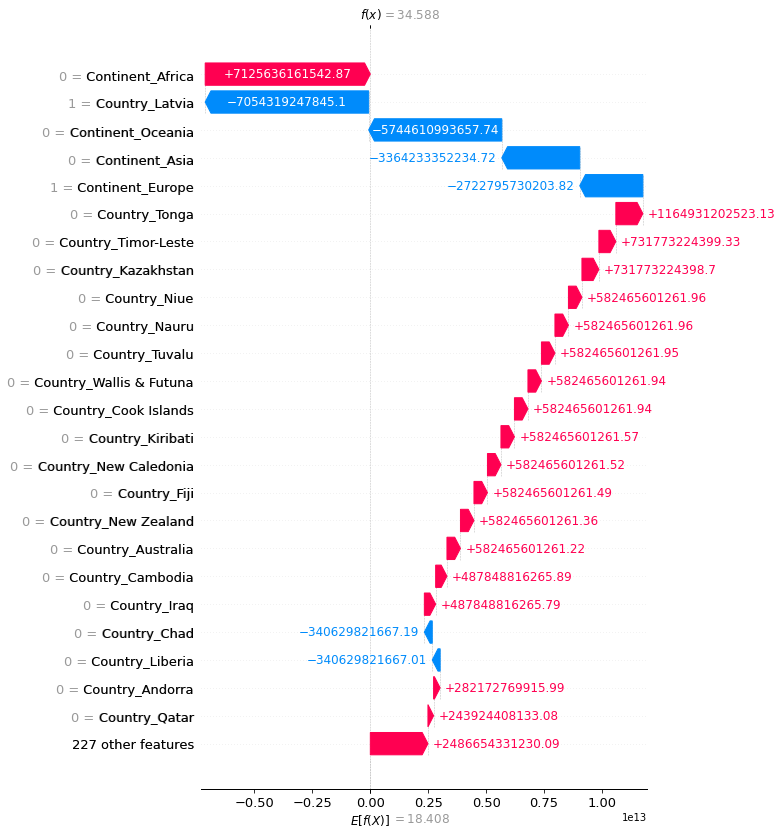

In [ ]:

# Waterfall plot for linear model
sample_ind = 18
shap.plots.waterfall(shap_values_lg[sample_ind], max_display=25)

# **Partial Dependence Plot**

Linear Model -

If we closely look at the PDP of the linear model we can see that features are tuned while freezing the rest if them the output of the model varies linearly and these variables have the most significant effect on the output.

X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but 

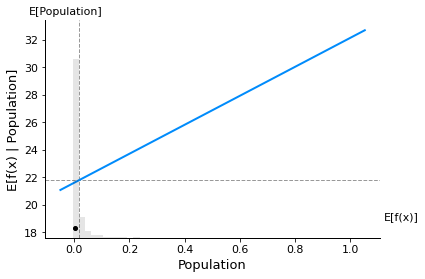

X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but 

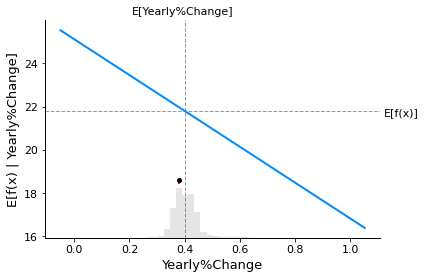

X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but 

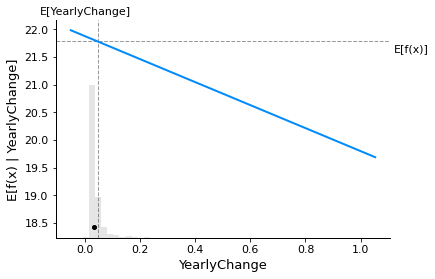

X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but 

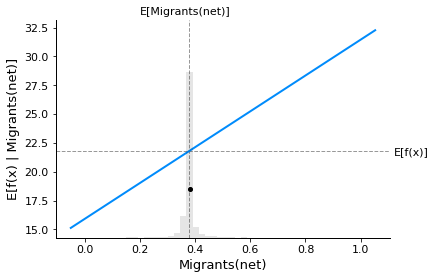

X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but 

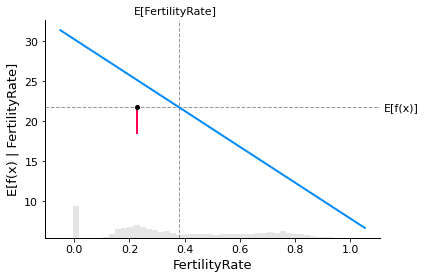

X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but 

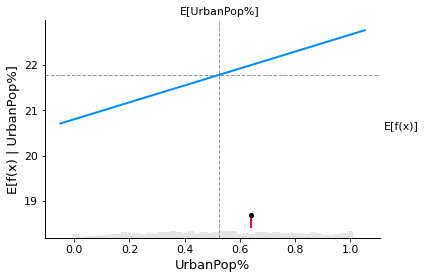

X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but 

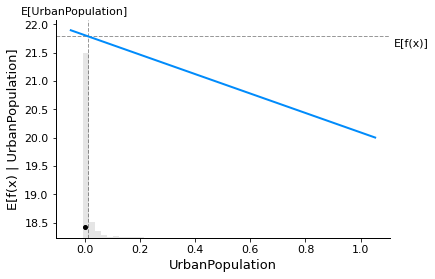

X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but 

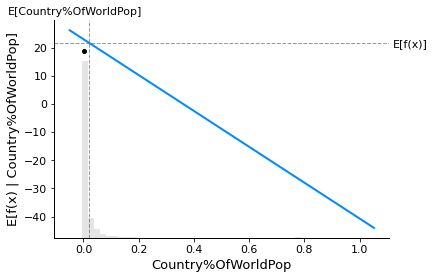

X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but 

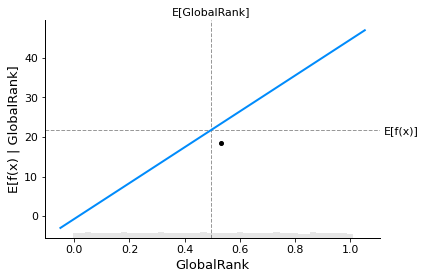

X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but 

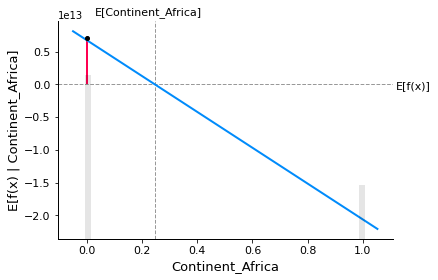

X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but 

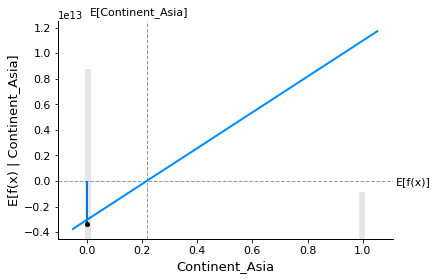

X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but 

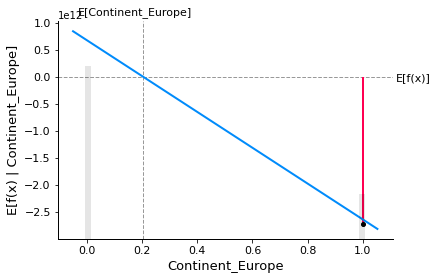

X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but 

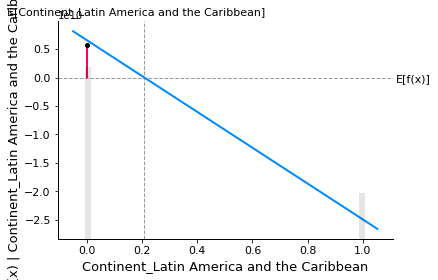

X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but 

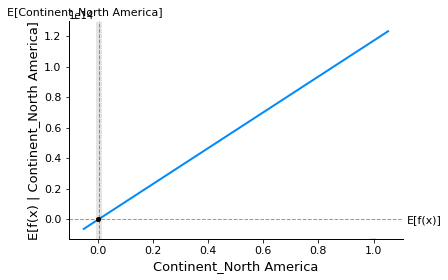

X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but 

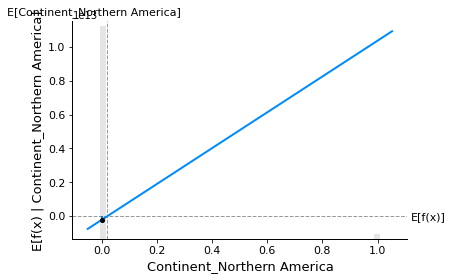

X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but 

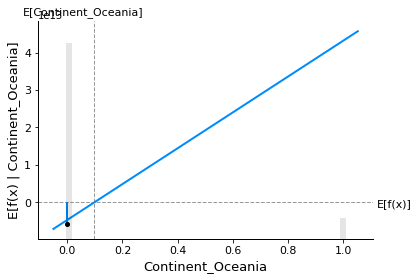

X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but 

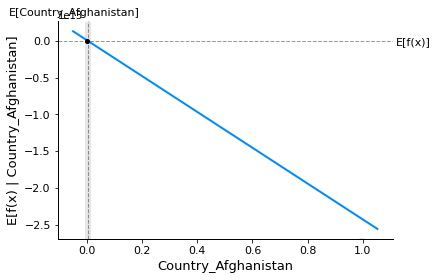

X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but 

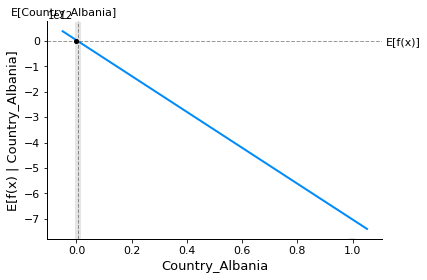

X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but 

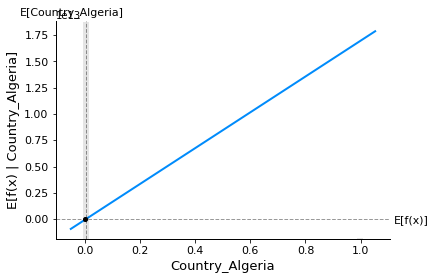

X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but 

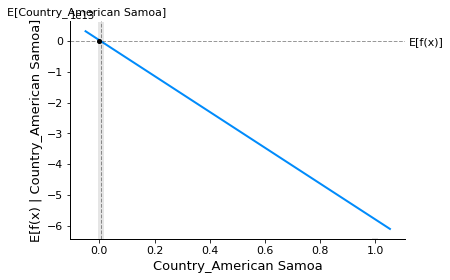

X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but 

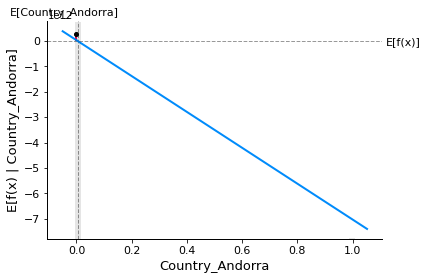

X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but 

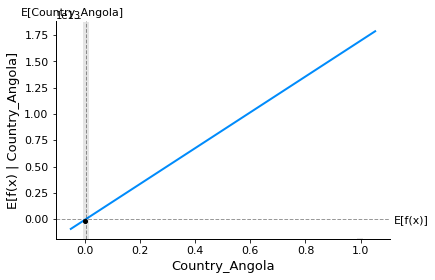

X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but 

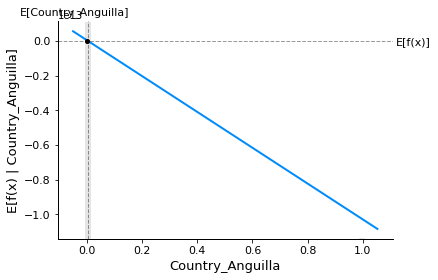

X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but 

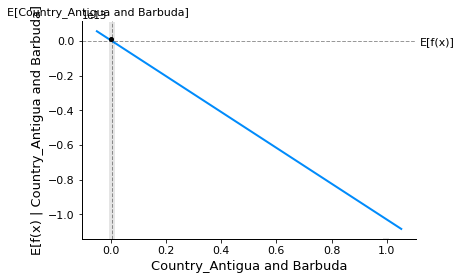

X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but 

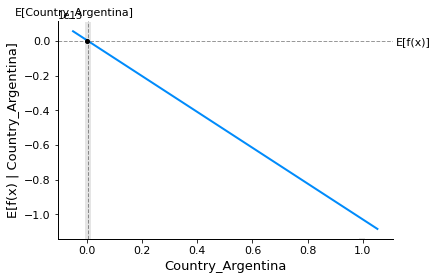

X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but 

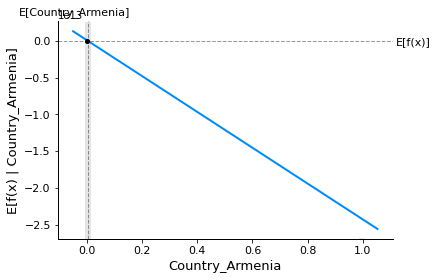

X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but 

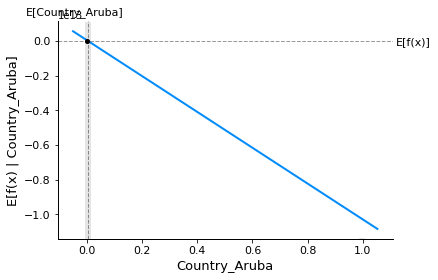

X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but 

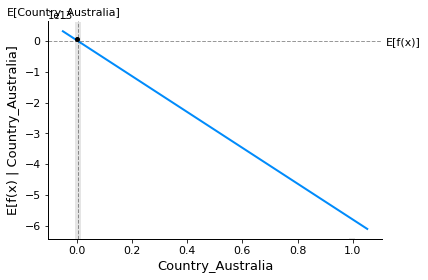

X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but 

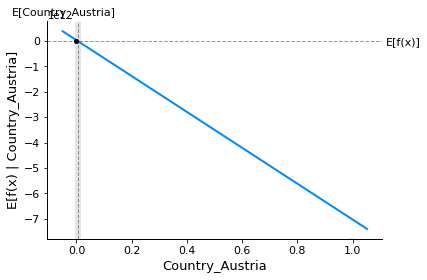

X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but 

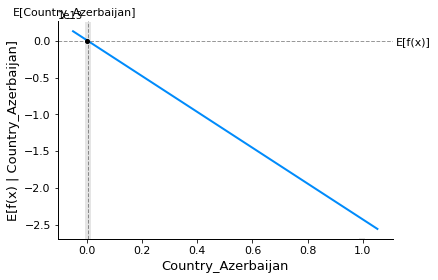

X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but 

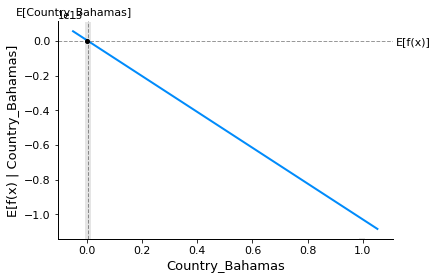

X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but 

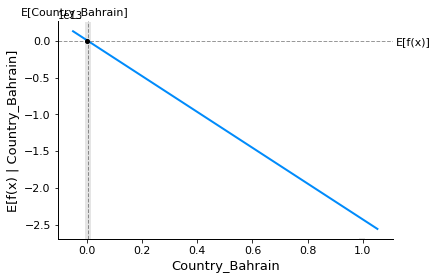

X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but 

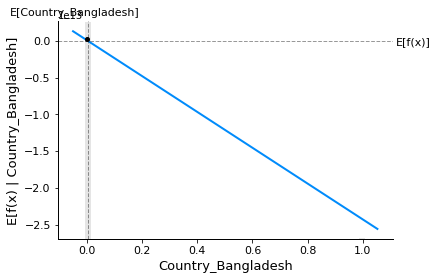

X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but 

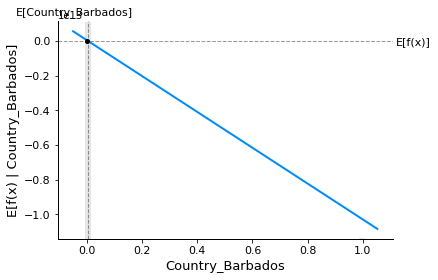

X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but 

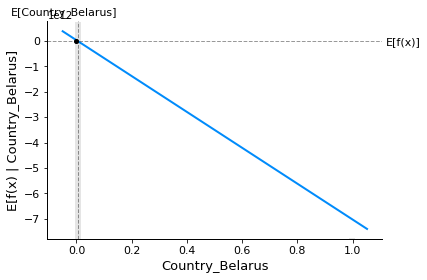

X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but 

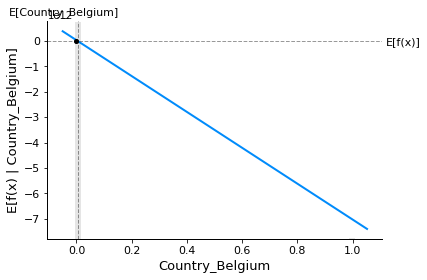

X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but 

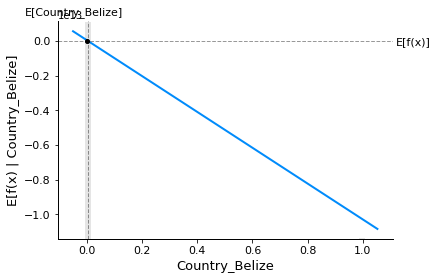

X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but 

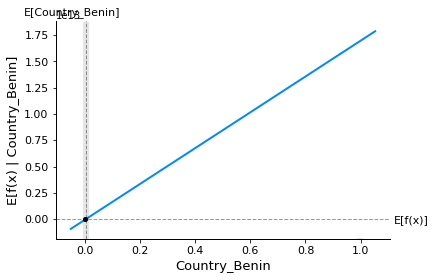

X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but 

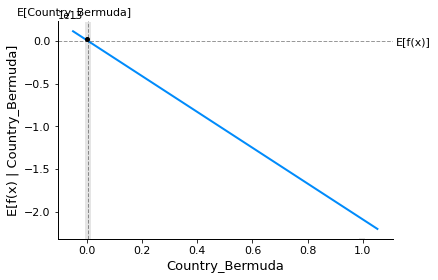

X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but 

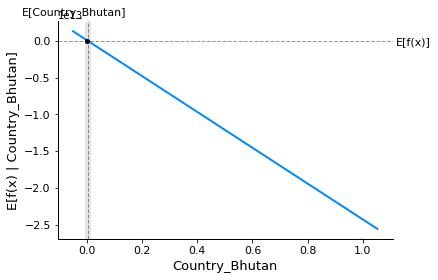

X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but 

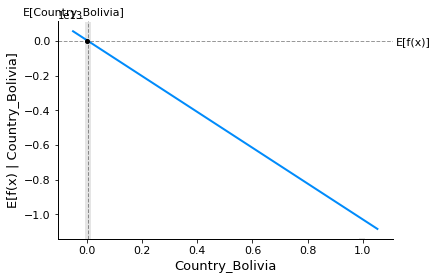

X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but 

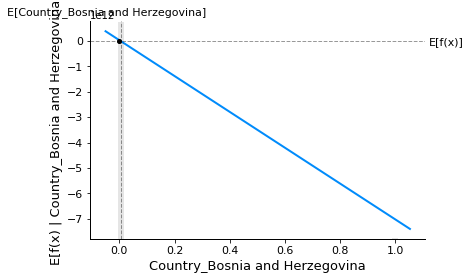

X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but 

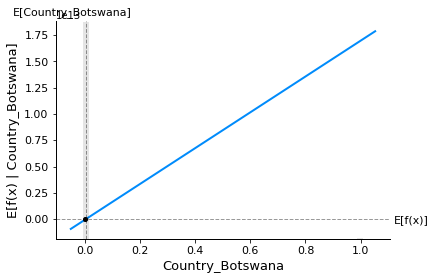

X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but 

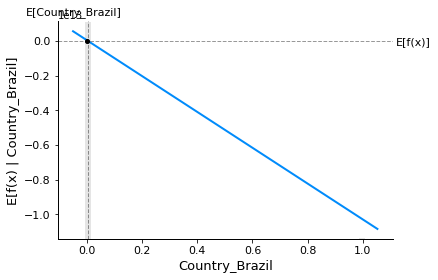

X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but 

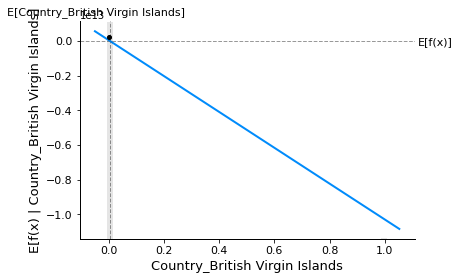

X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but 

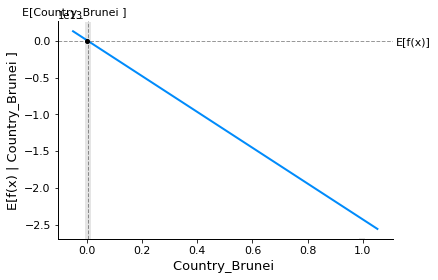

X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but 

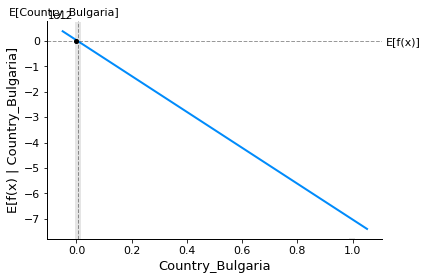

X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but 

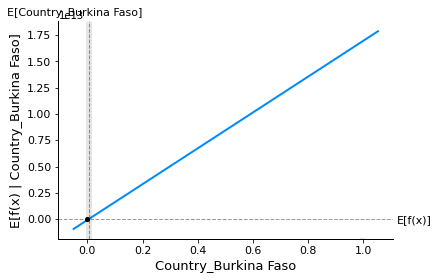

X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but 

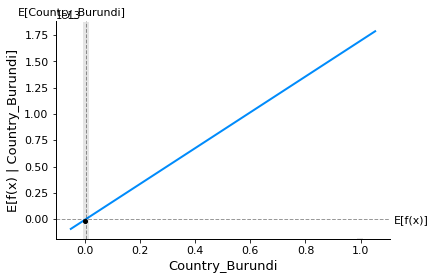

X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but 

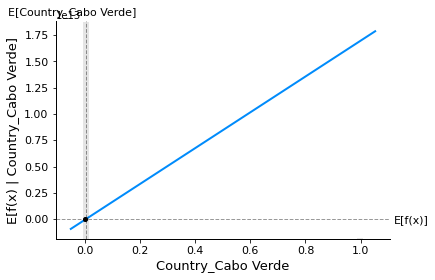

X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but 

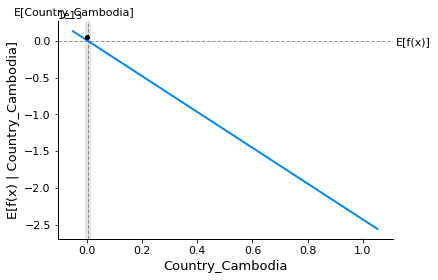

X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but 

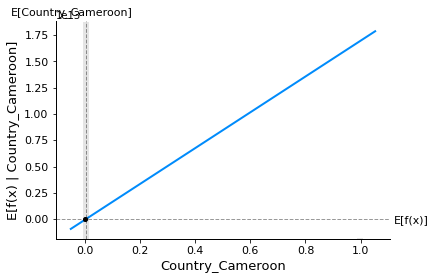

X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but 

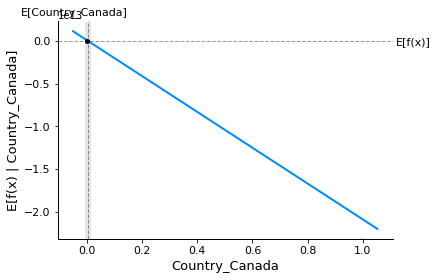

X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but 

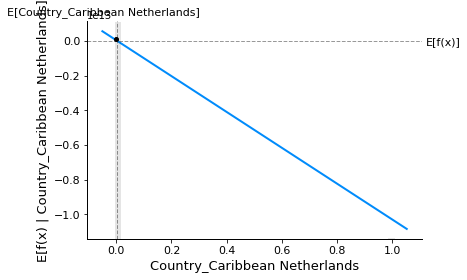

X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but 

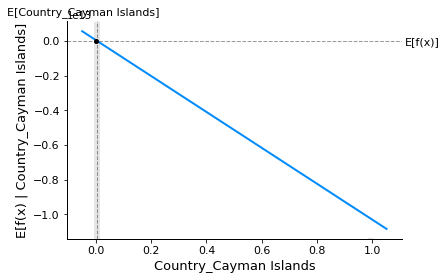

X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but 

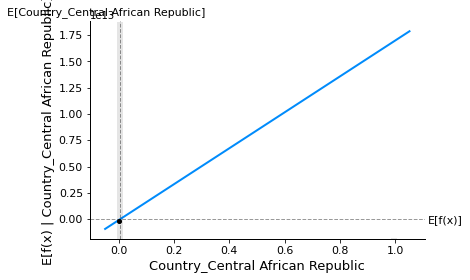

X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but 

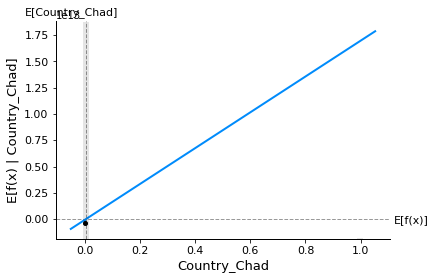

X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but 

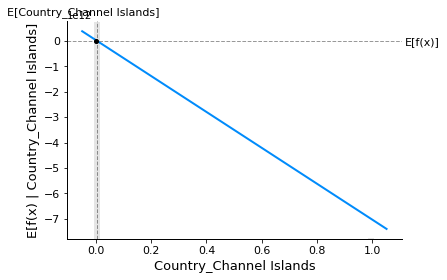

X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but 

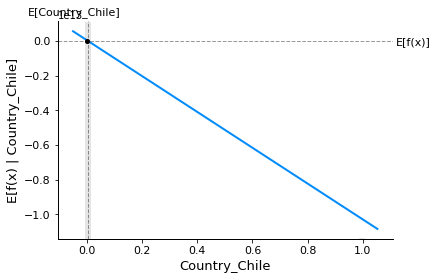

X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but 

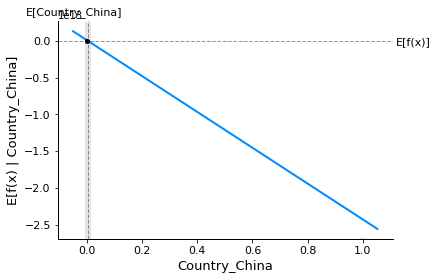

X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but 

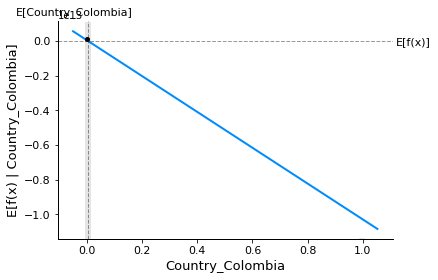

X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but 

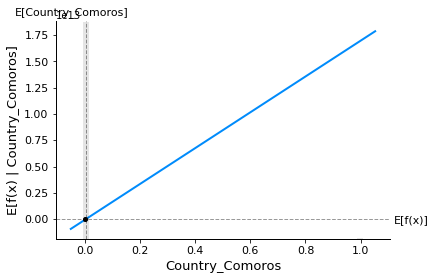

X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but 

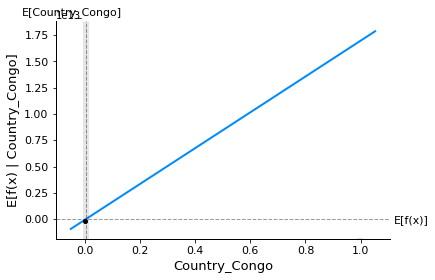

X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but 

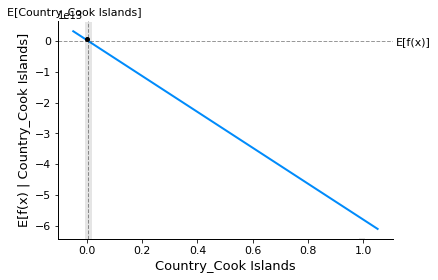

X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but 

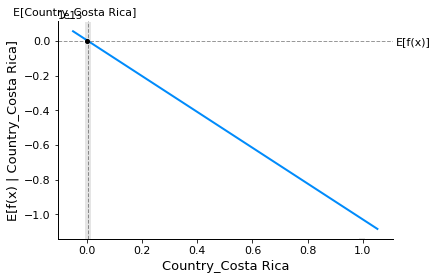

X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but 

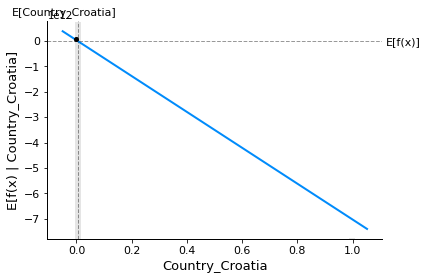

X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but 

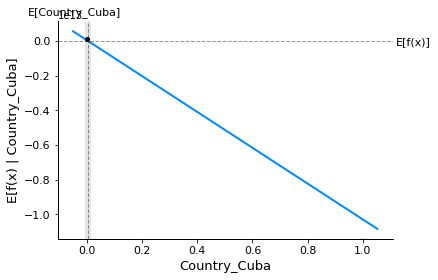

X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but 

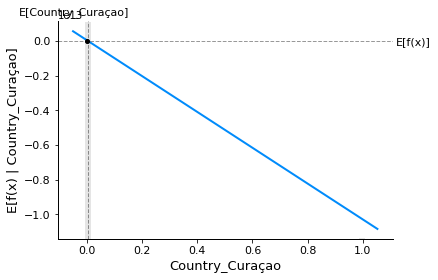

X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but 

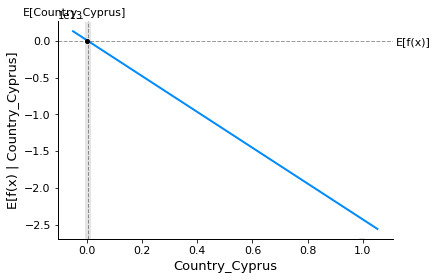

X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but 

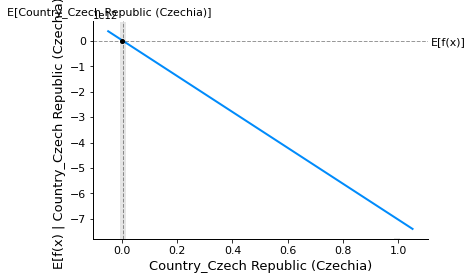

X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but 

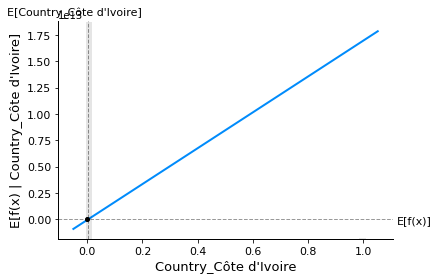

X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but 

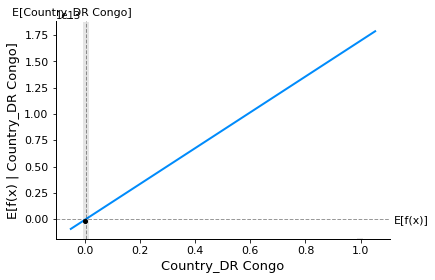

X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but 

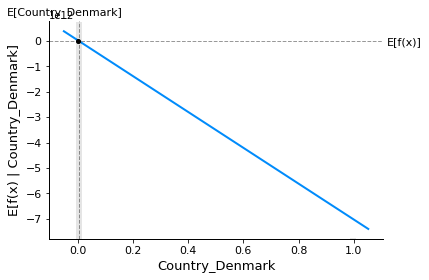

X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but 

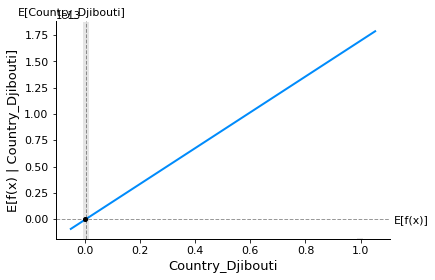

X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but 

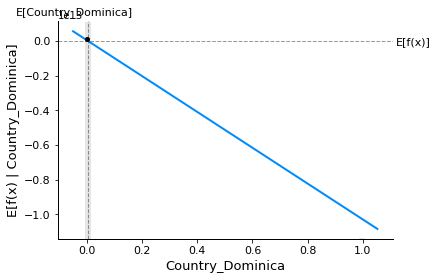

X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but 

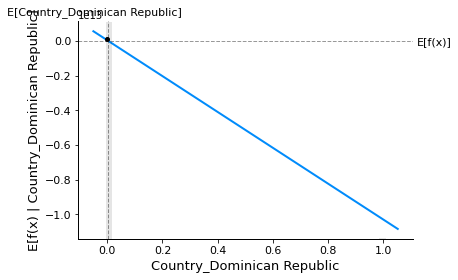

X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but 

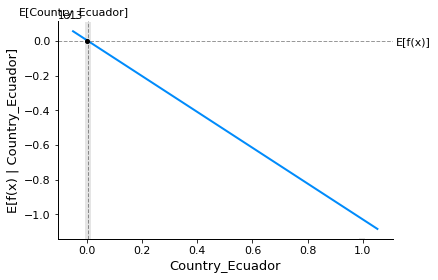

X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but 

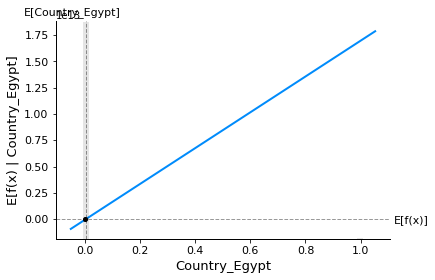

X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but 

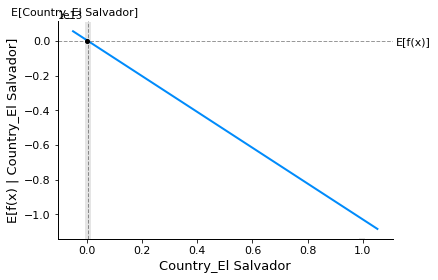

X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but 

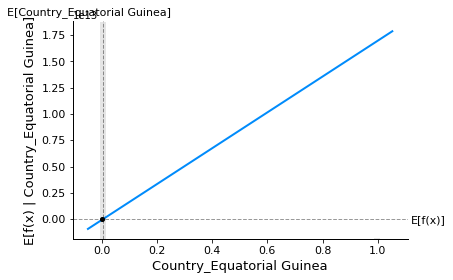

X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but 

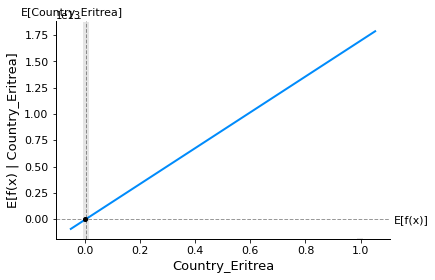

X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but 

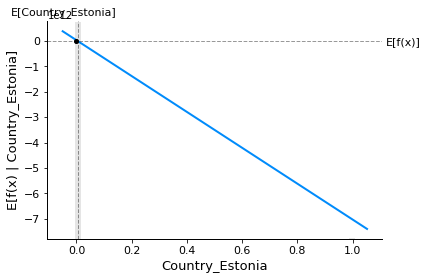

X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but 

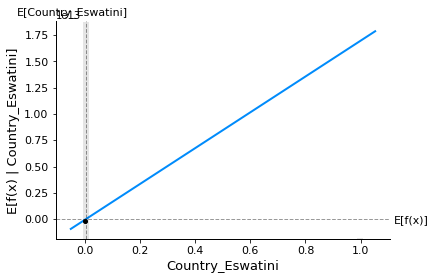

X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but 

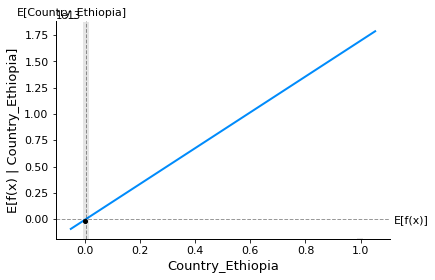

X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but 

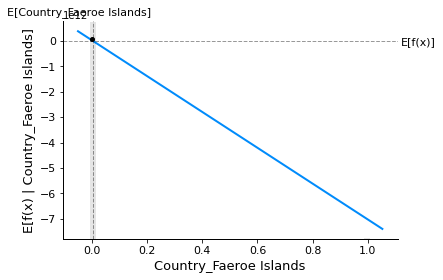

X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but 

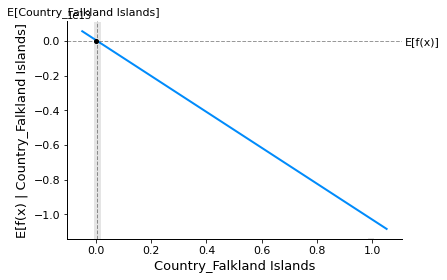

X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but 

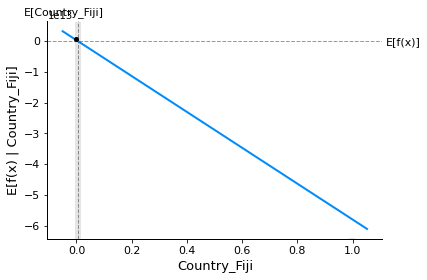

X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but 

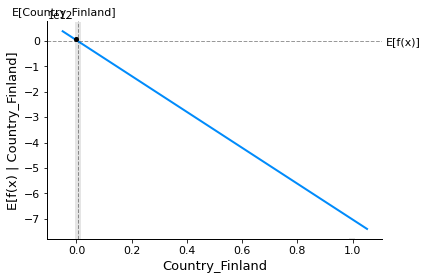

X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but 

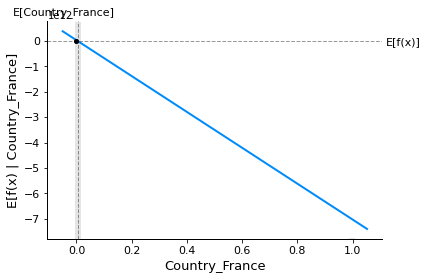

X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but 

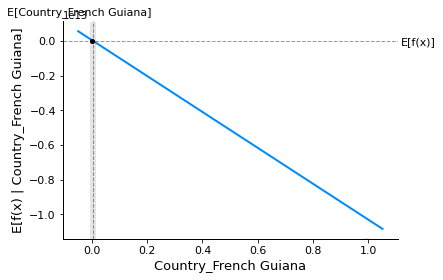

X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but 

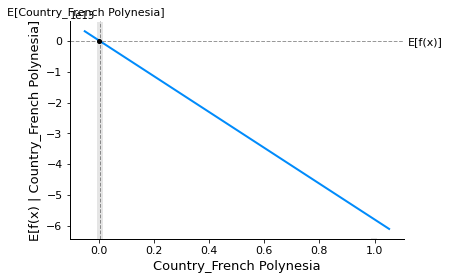

X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but 

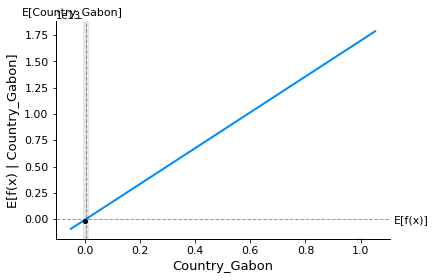

X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but 

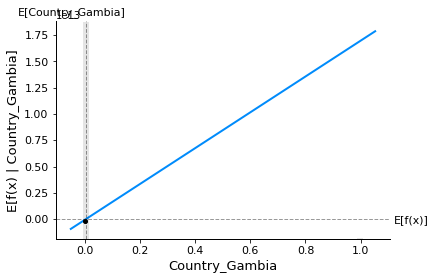

X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but 

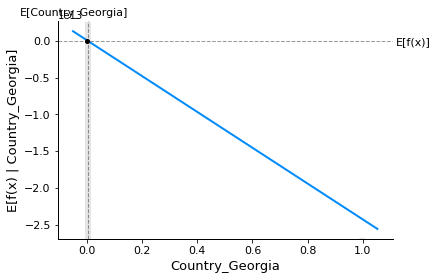

X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but 

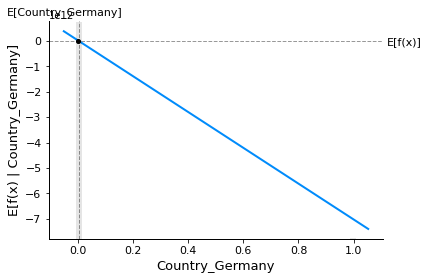

X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but 

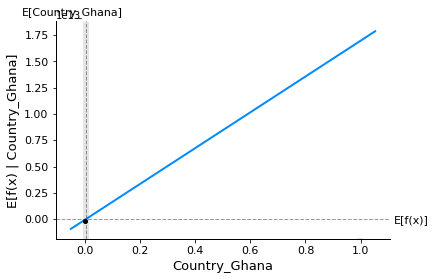

X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but 

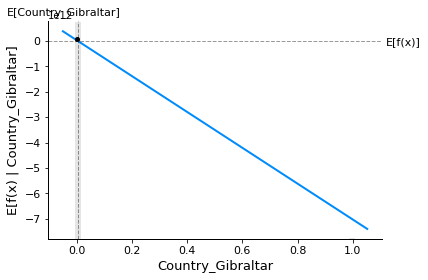

X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but 

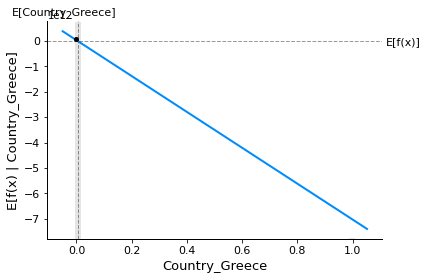

X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but 

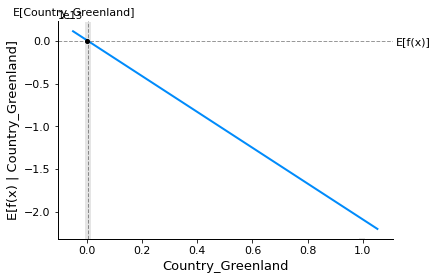

X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but 

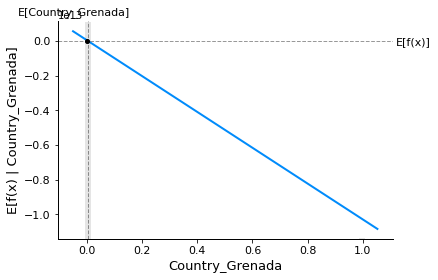

X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but 

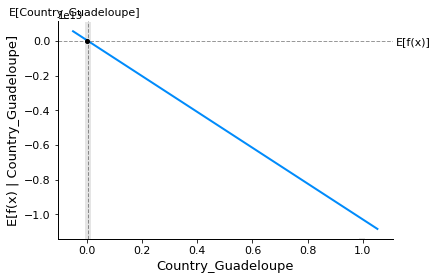

X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but 

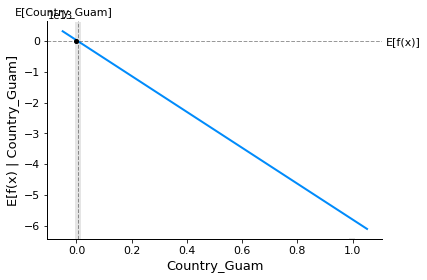

X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but 

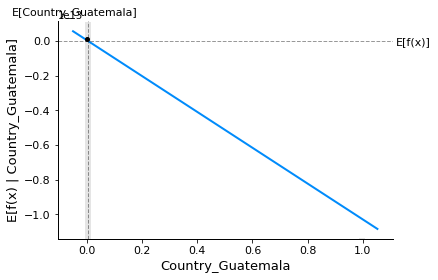

X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but 

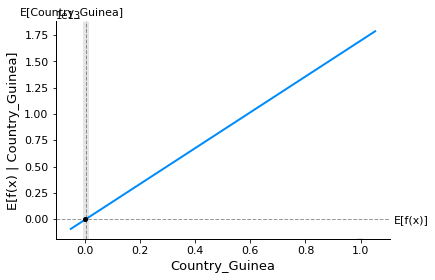

X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but 

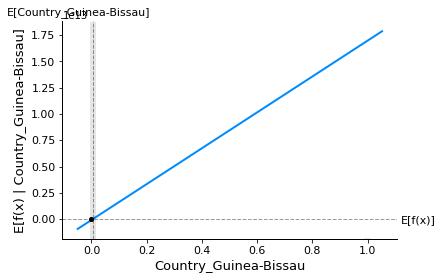

X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but 

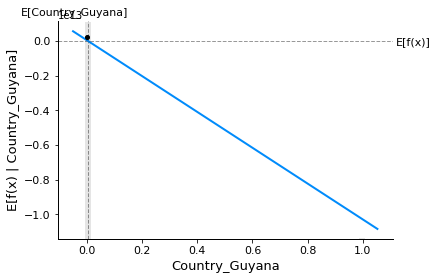

X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but 

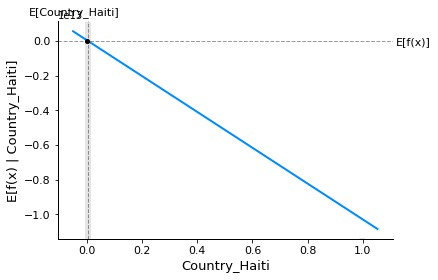

X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but 

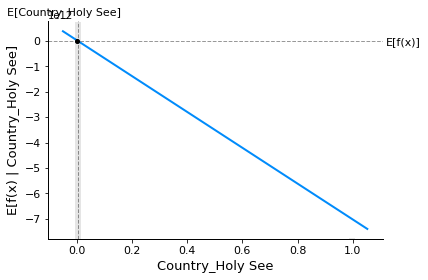

X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but 

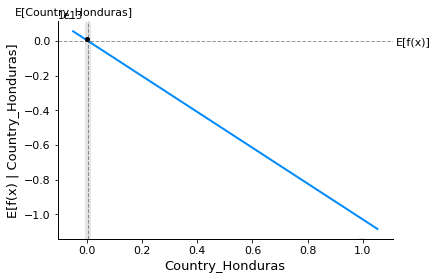

X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but 

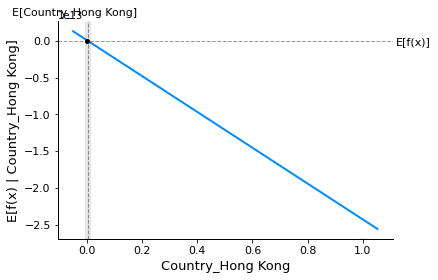

X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but 

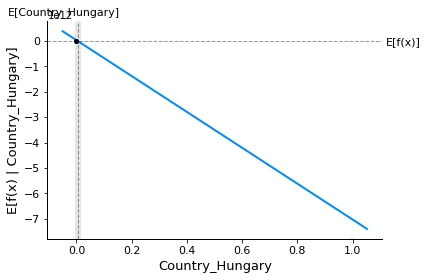

X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but 

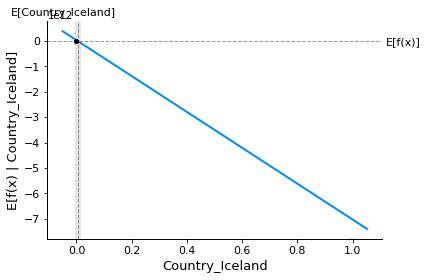

X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but 

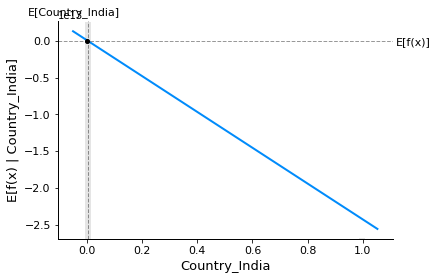

X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but 

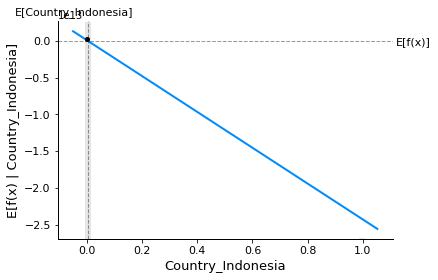

X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but 

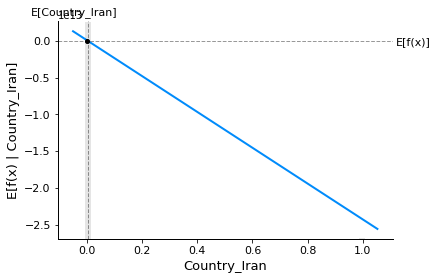

X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but 

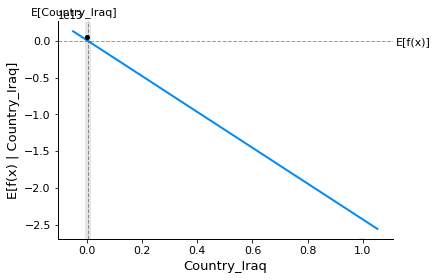

X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but 

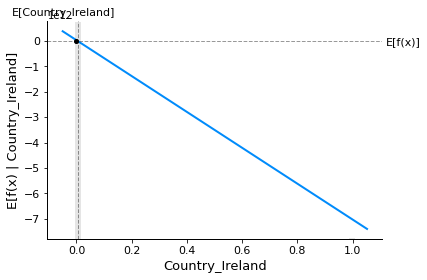

X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but 

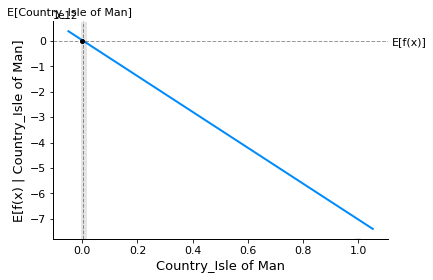

X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but 

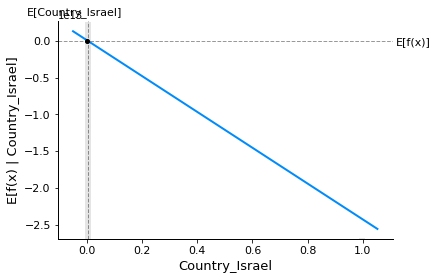

X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but 

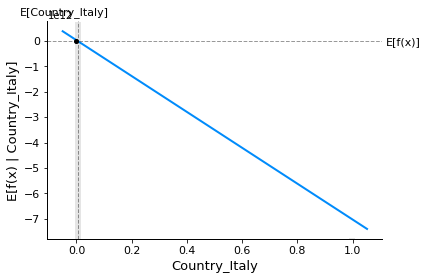

X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but 

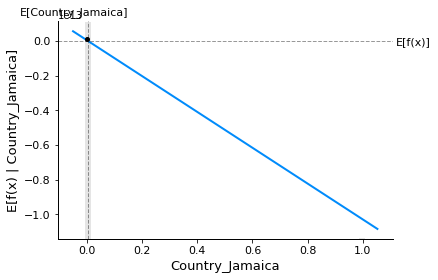

X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but 

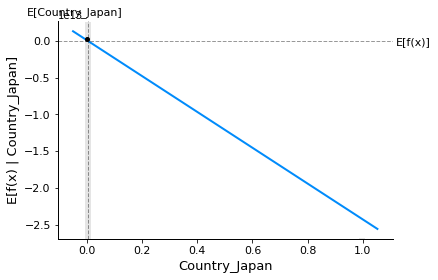

X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but 

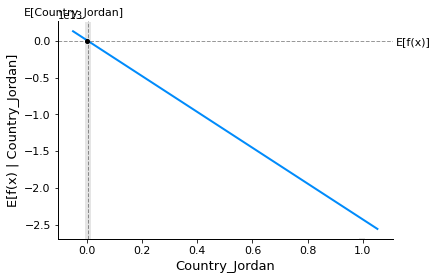

X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but 

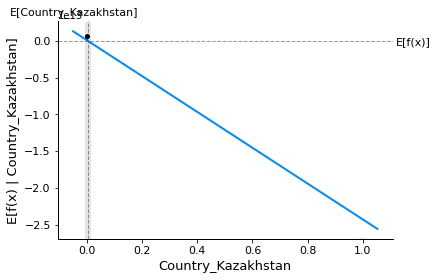

X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but 

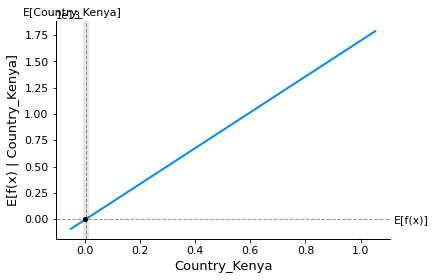

X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but 

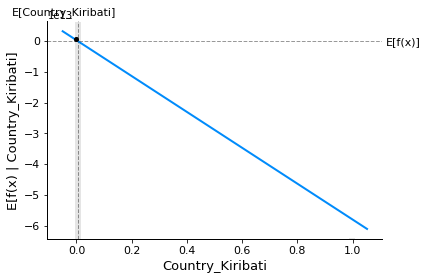

X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but 

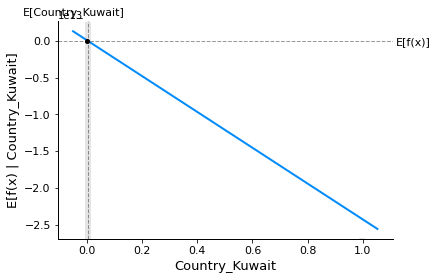

X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but 

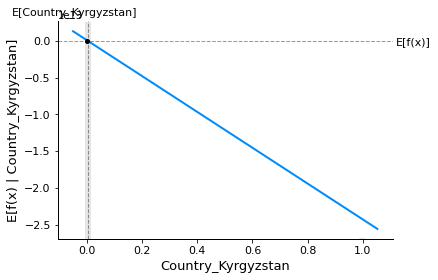

X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but 

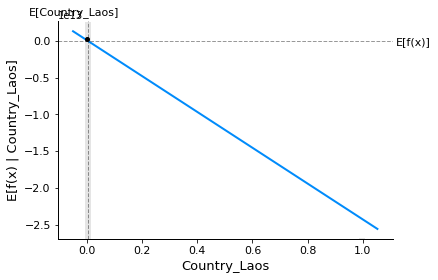

X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but 

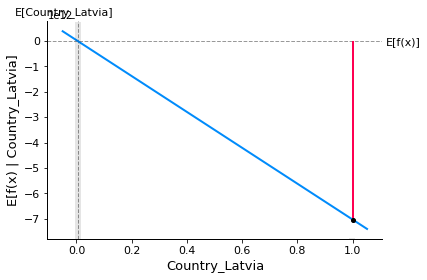

X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but 

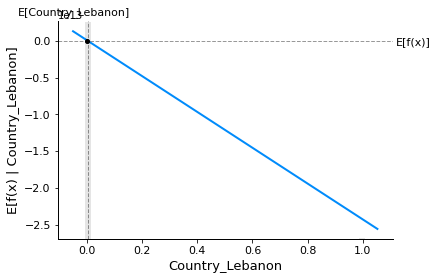

X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but 

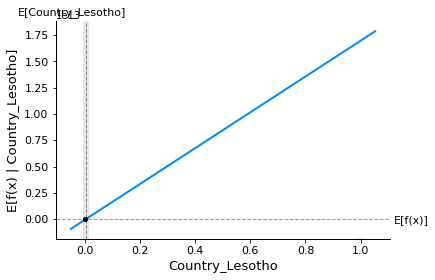

X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but 

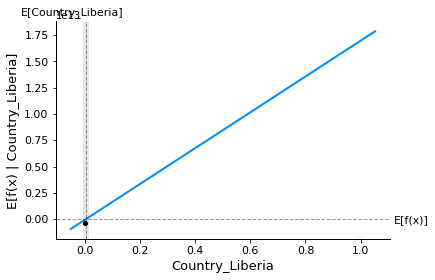

X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but 

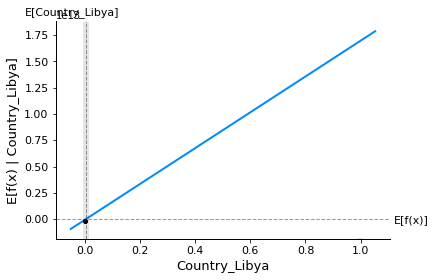

X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but 

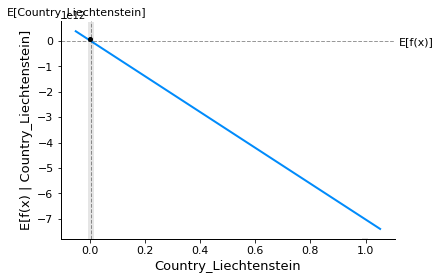

X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but 

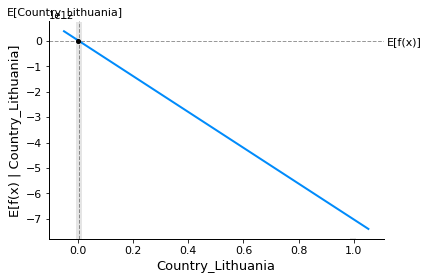

X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but 

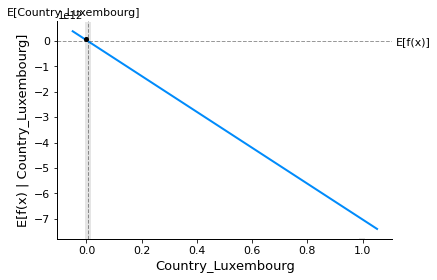

X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but 

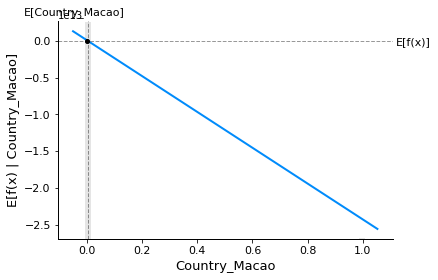

X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but 

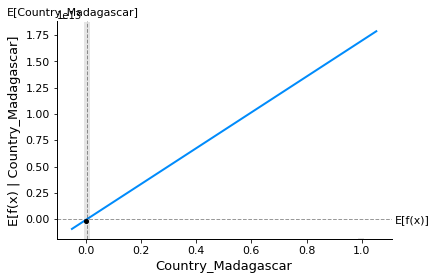

X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but 

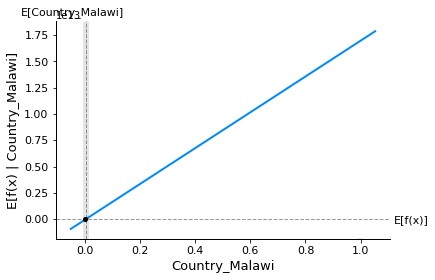

X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but 

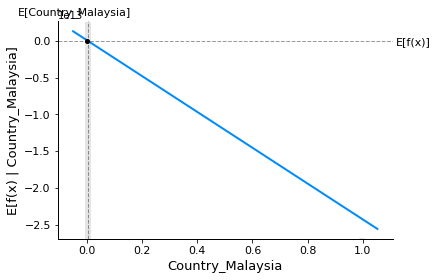

X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but 

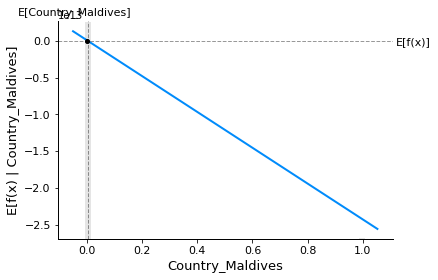

X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but 

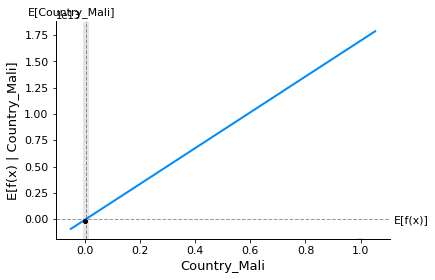

X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but 

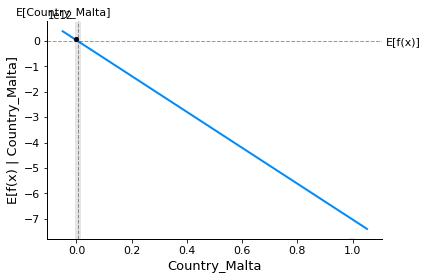

X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but 

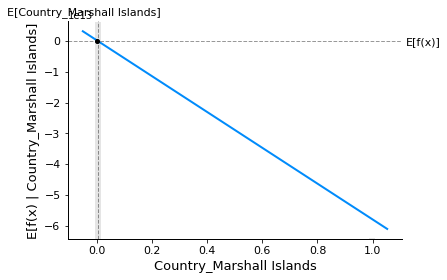

X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but 

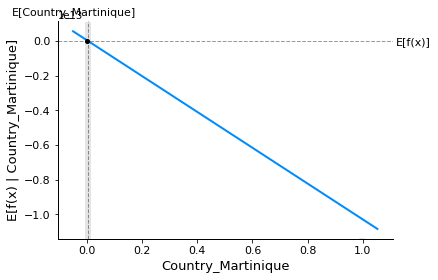

X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but 

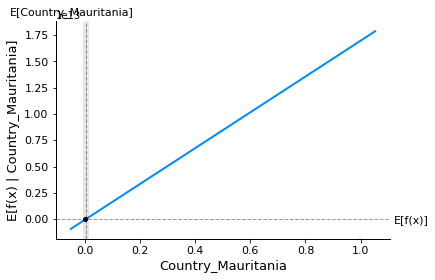

X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but 

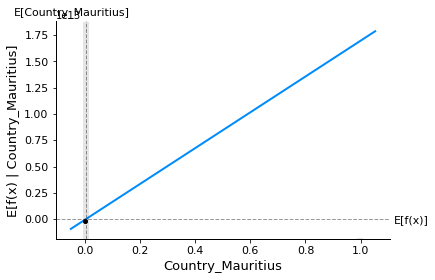

X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but 

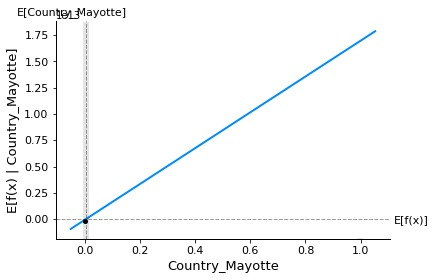

X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but 

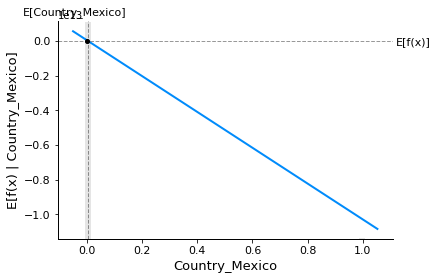

X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but 

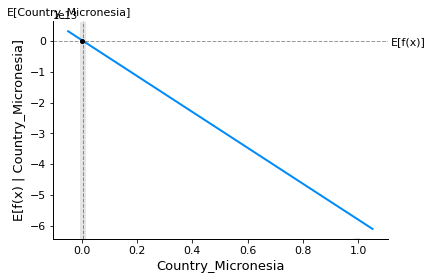

X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but 

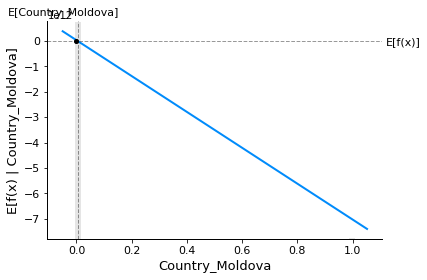

X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but 

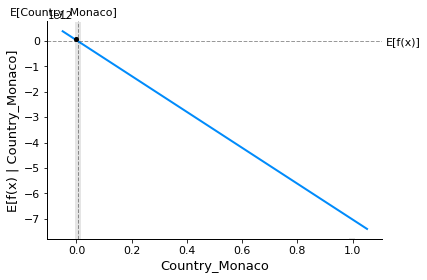

X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but 

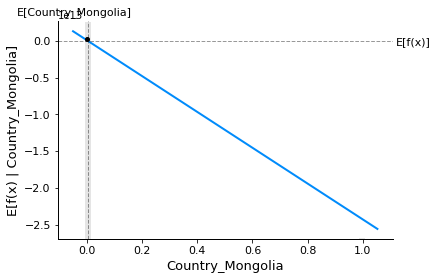

X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but 

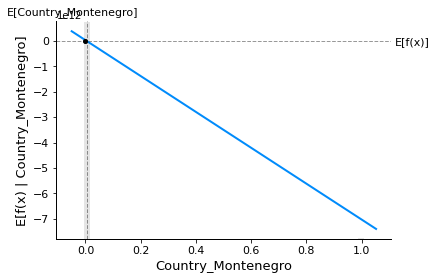

X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but 

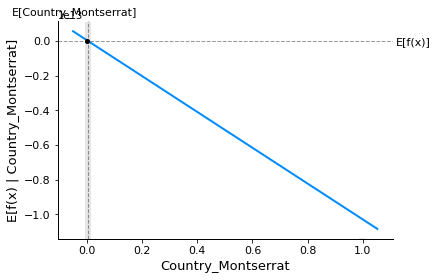

X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but 

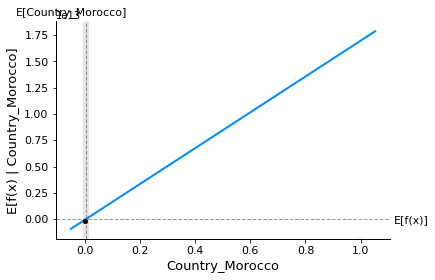

X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but 

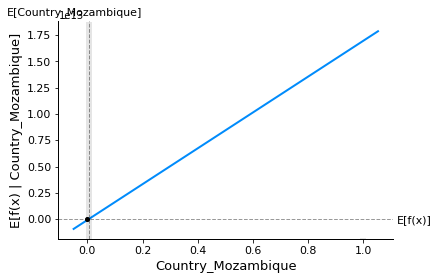

X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but 

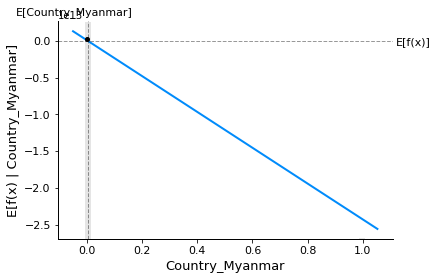

X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but 

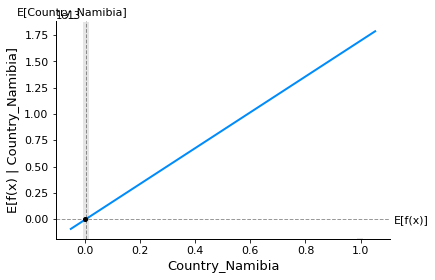

X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but 

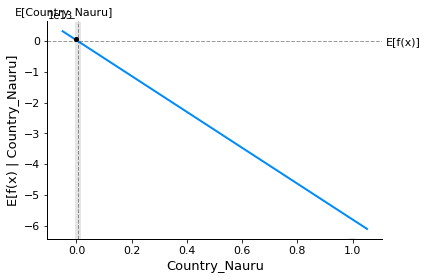

X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but 

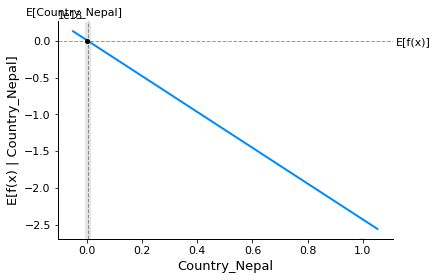

X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but 

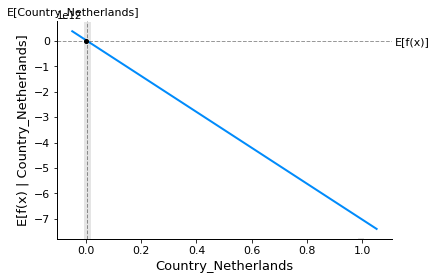

X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but 

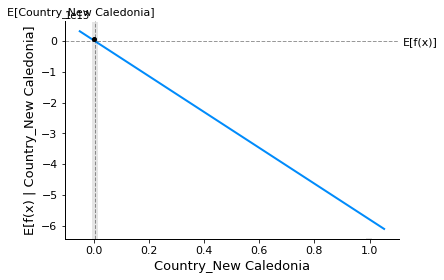

X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but 

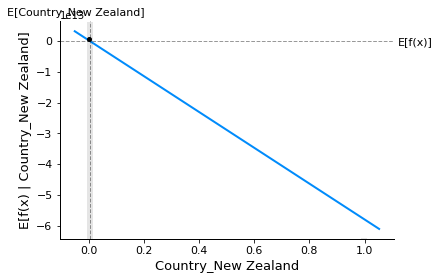

X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but 

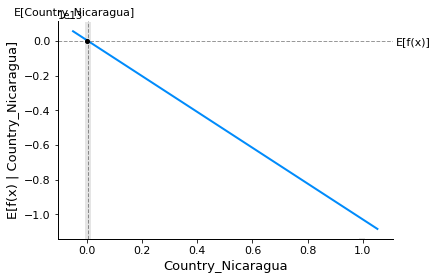

X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but 

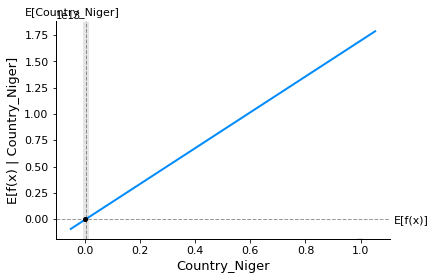

X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but 

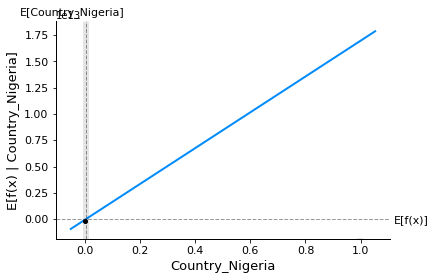

X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but 

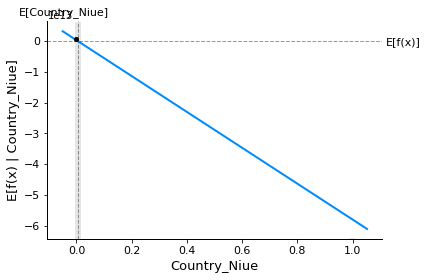

X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but 

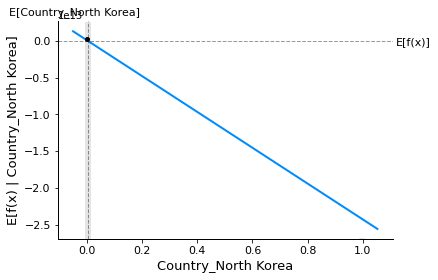

X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but 

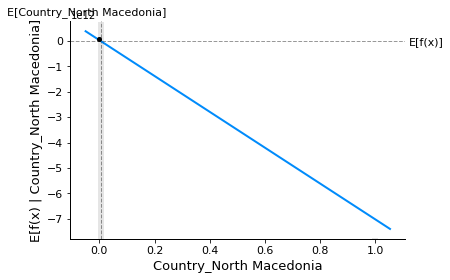

X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but 

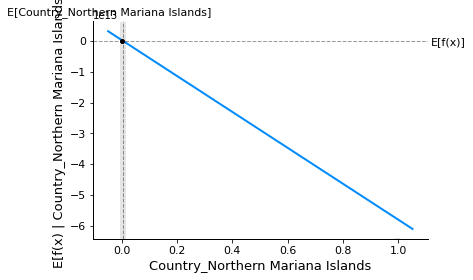

X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but 

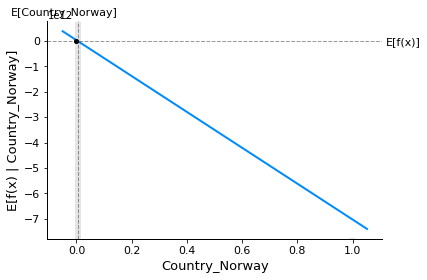

X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but 

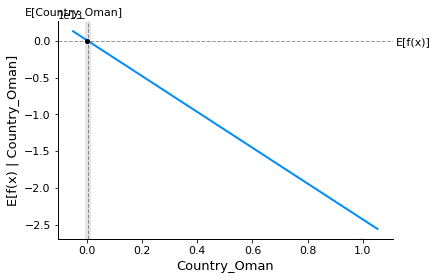

X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but 

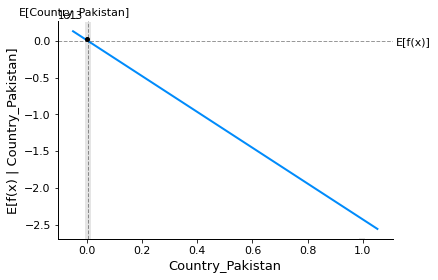

X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but 

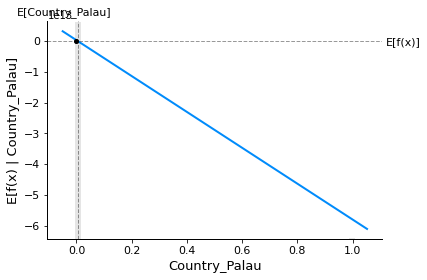

X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but 

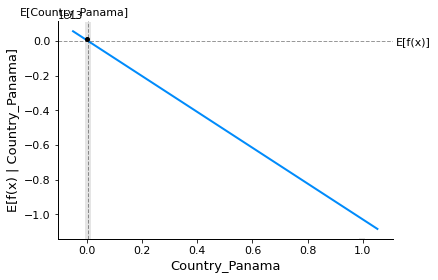

X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but 

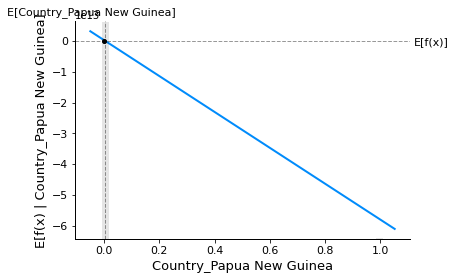

X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but 

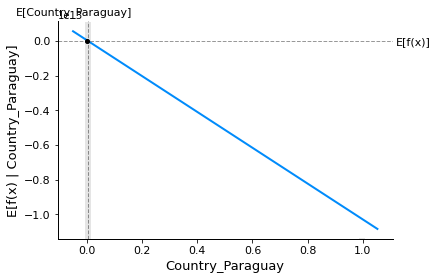

X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but 

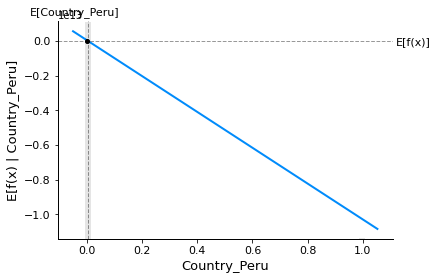

X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but 

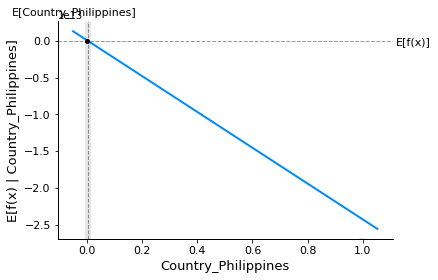

X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but 

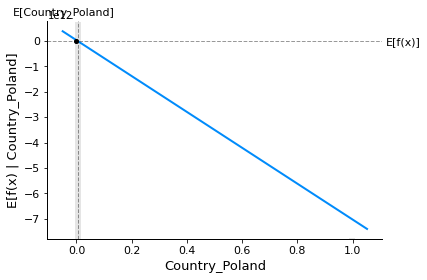

X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but 

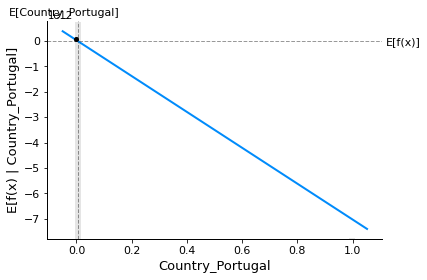

X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but 

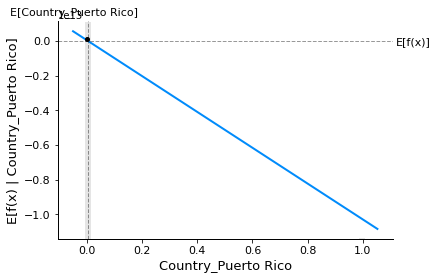

X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but 

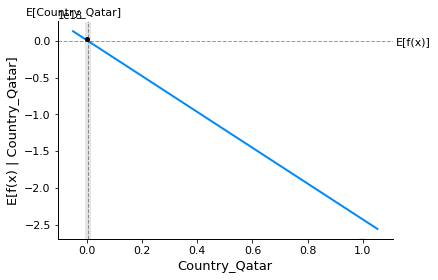

X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but 

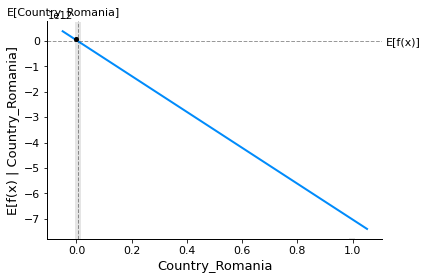

X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but 

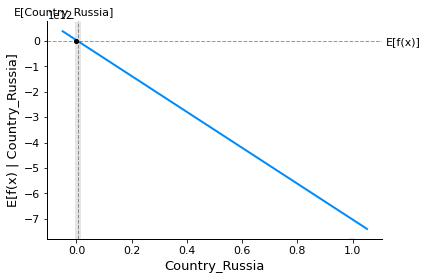

X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but 

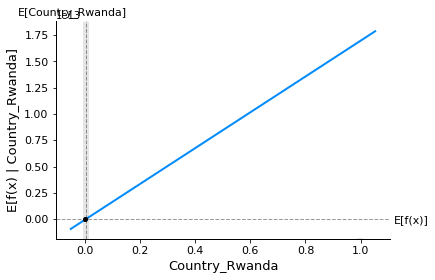

X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but 

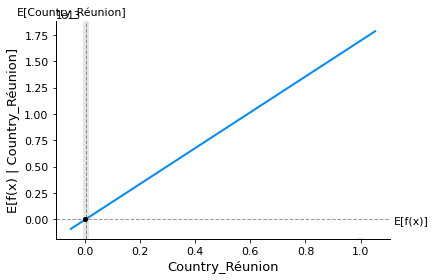

X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but 

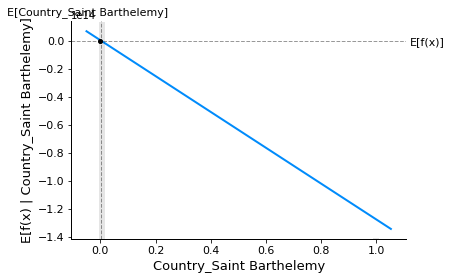

X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but 

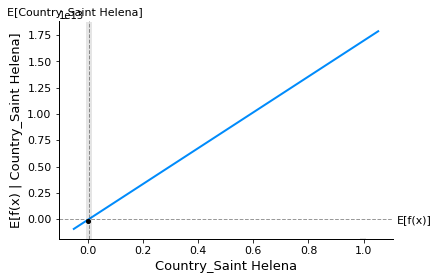

X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but 

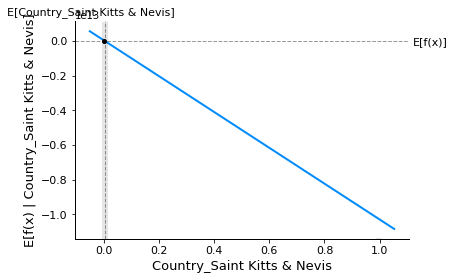

X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but 

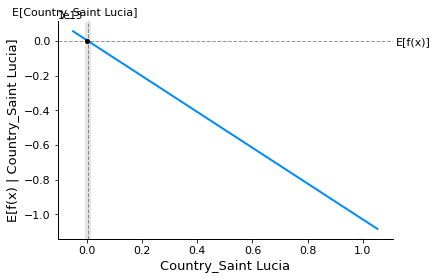

X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but 

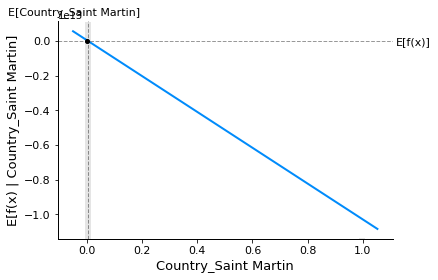

X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but 

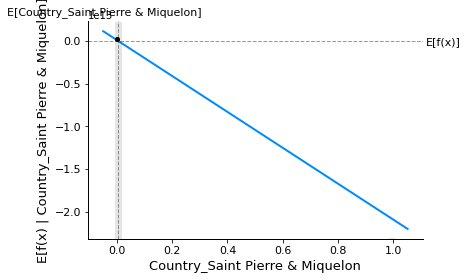

X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but 

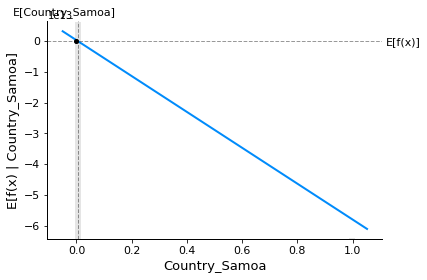

X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but 

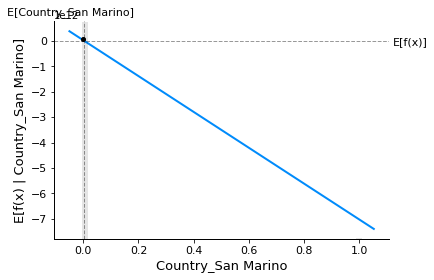

X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but 

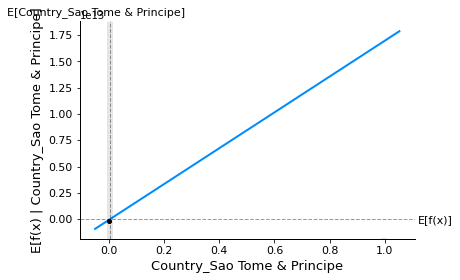

X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but 

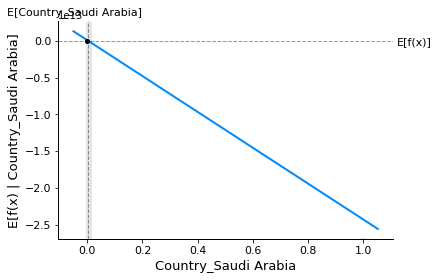

X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but 

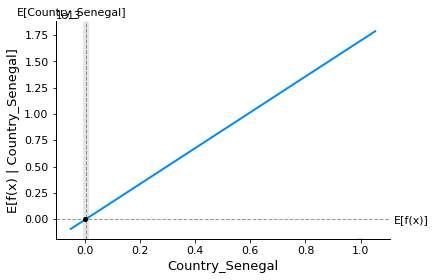

X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but 

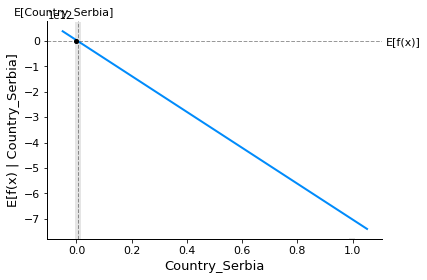

X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but 

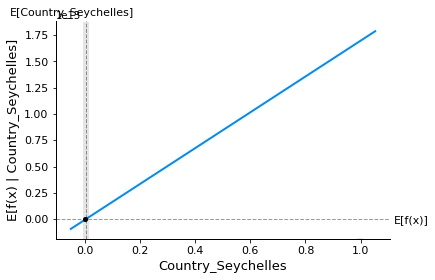

X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but 

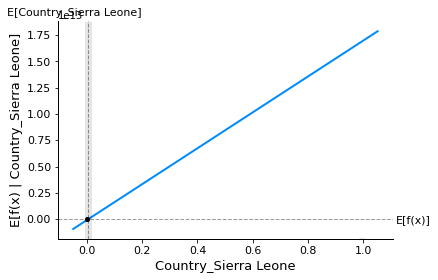

X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but 

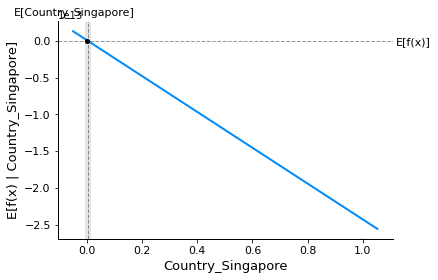

X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but 

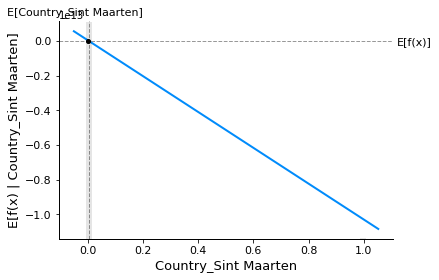

X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but 

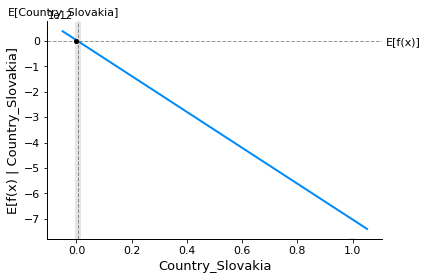

X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but 

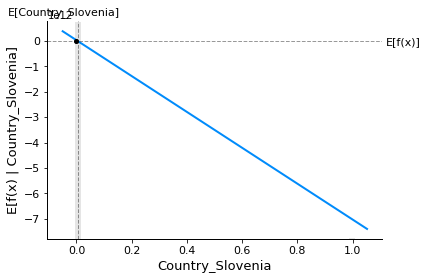

X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but 

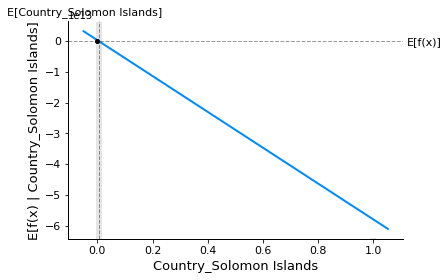

X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but 

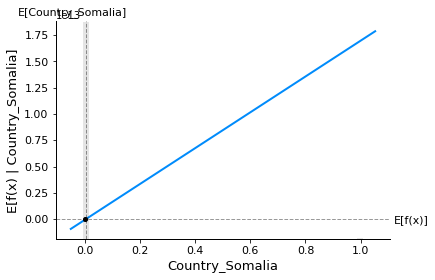

X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but 

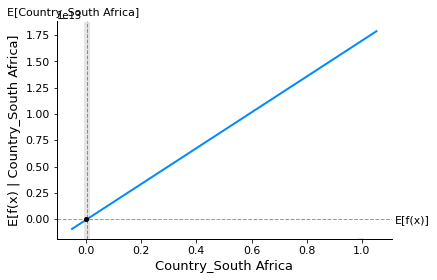

X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but 

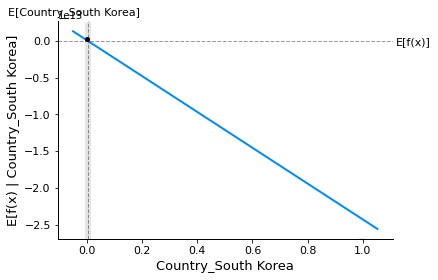

X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but 

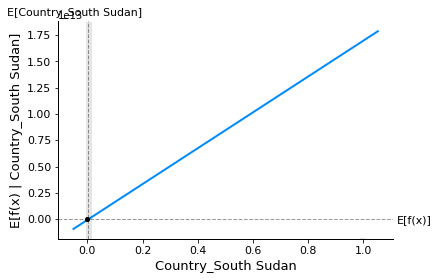

X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but 

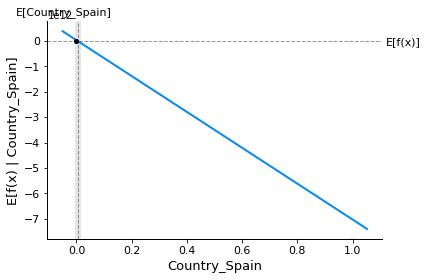

X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but 

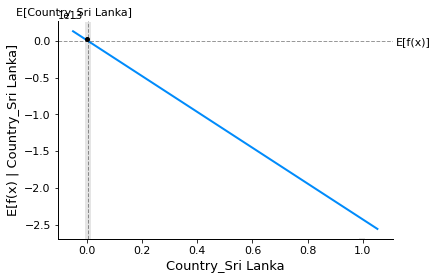

X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but 

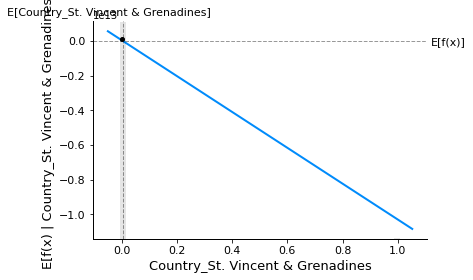

X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but 

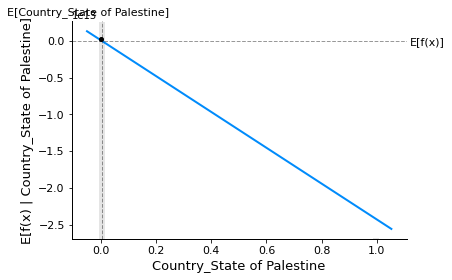

X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but 

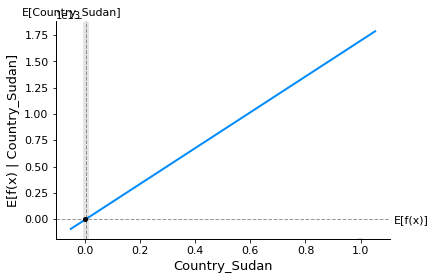

X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but 

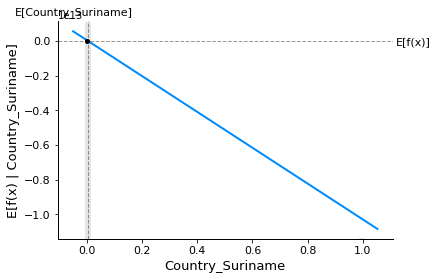

X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but 

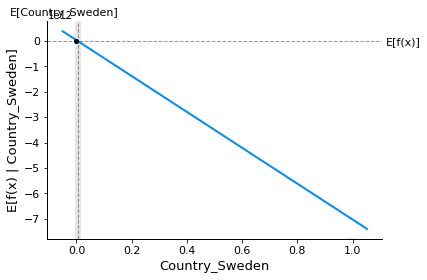

X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but 

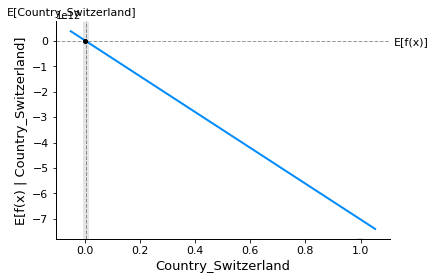

X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but 

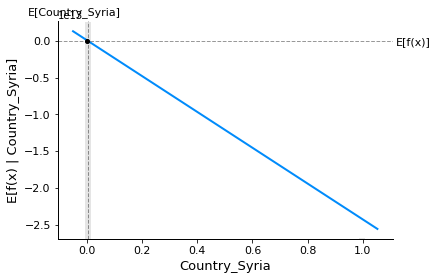

X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but 

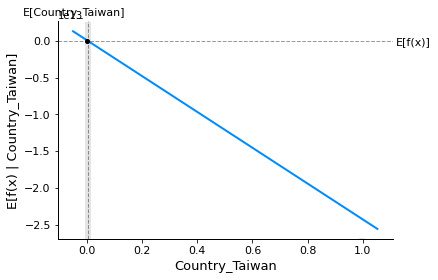

X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but 

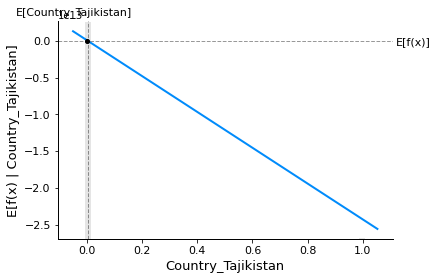

X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but 

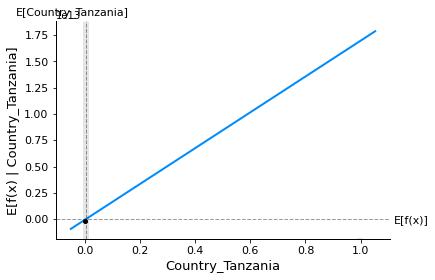

X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but 

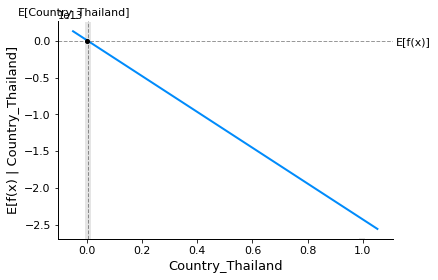

X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but 

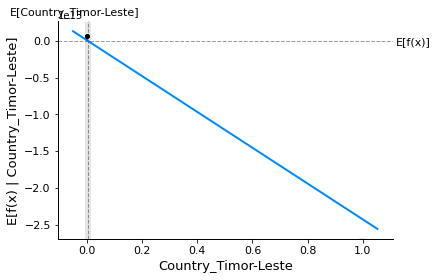

X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but 

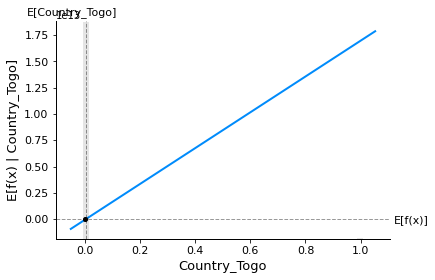

X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but 

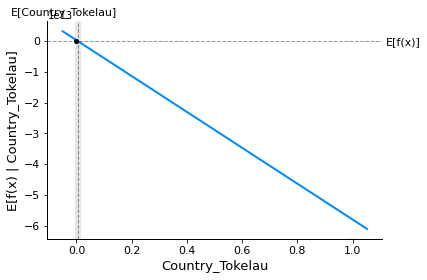

X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but 

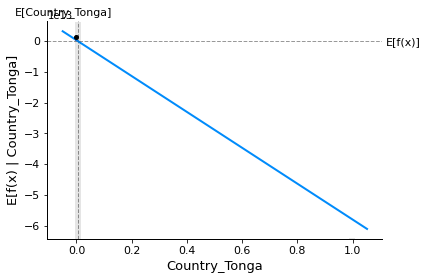

X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but 

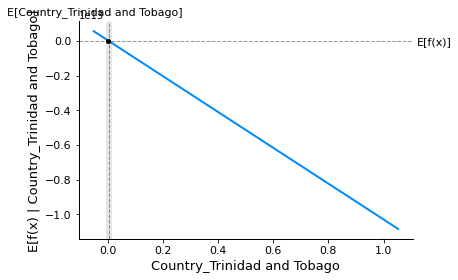

X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but 

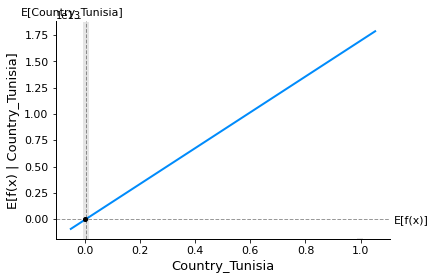

X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but 

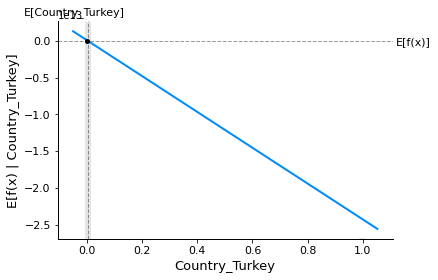

X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but 

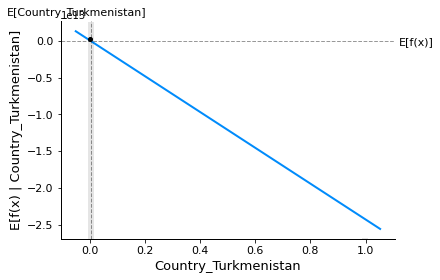

X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but 

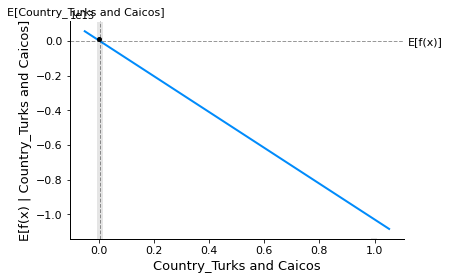

X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but 

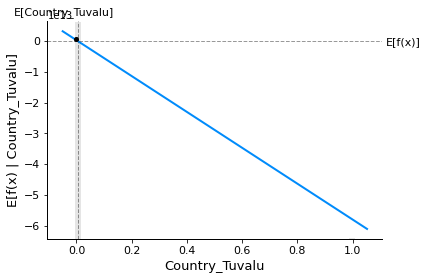

X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but 

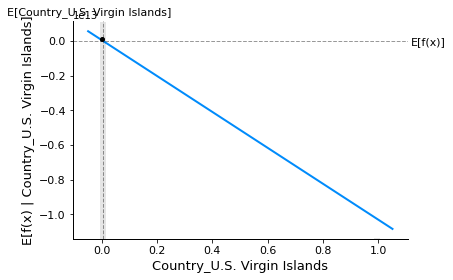

X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but 

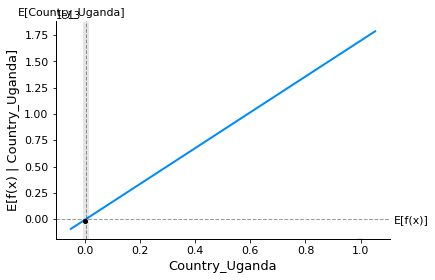

X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but 

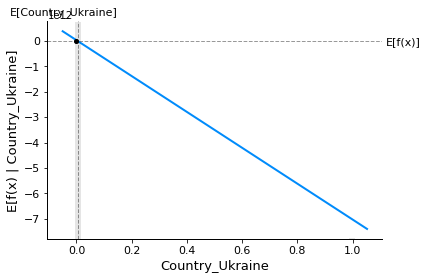

X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but 

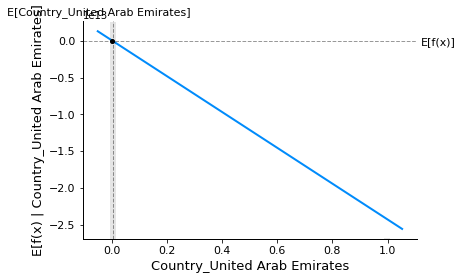

X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but 

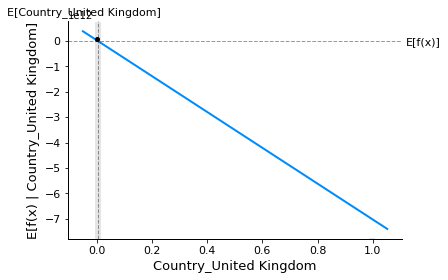

X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but 

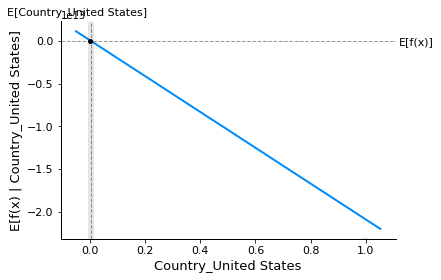

X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but 

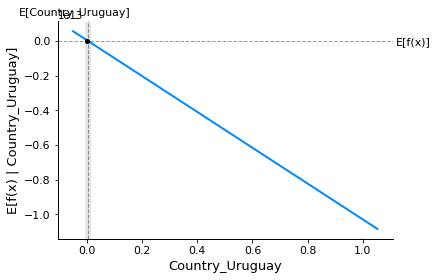

X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but 

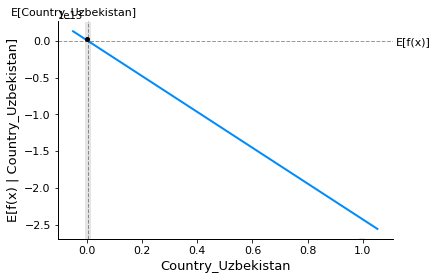

X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but 

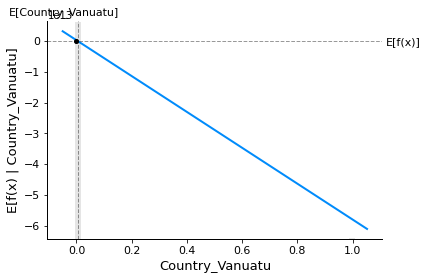

X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but 

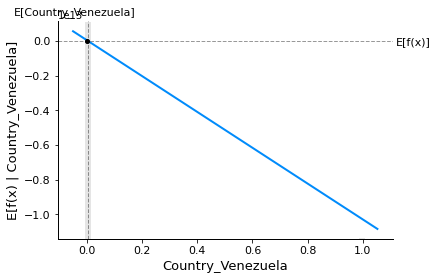

X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but 

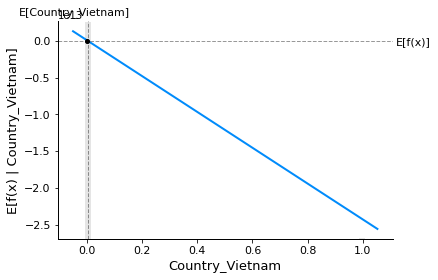

X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but 

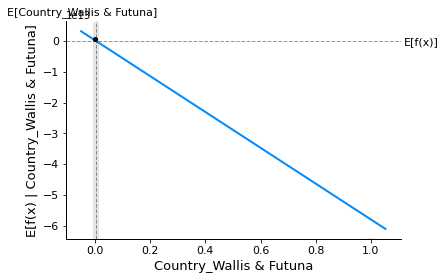

X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but 

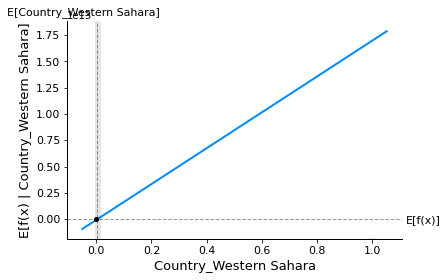

X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but 

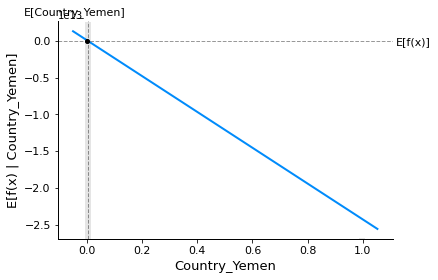

X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but 

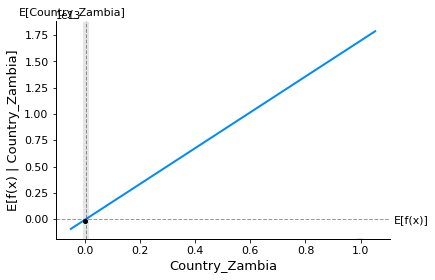

X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but LinearRegression was fitted without feature names
X has feature names, but 

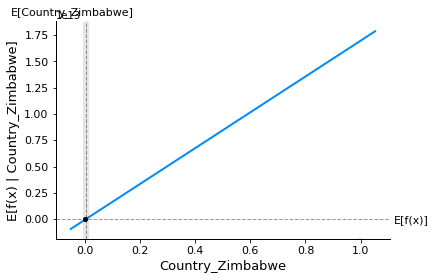

In [ ]:
for i in wp_df1.columns:
    # make a standard partial dependence plot
    sample_ind = 18
    shap.partial_dependence_plot(
        i,
        logmodel.predict,
        wp_df1,
        model_expected_value=True,
        feature_expected_value=True,
        ice=False,
        shap_values=shap_values_lg[sample_ind : sample_ind + 1, :],
    )

# **LIME (Local Interpretation Model-Agnostic Explanation) Analysis**

**Linear Model**


LIME builds a surrogate model, i.e. converts a more complicated model (say a deep tree-based model into a simple linear model) around the data points in which we are interested and then it will try to make an approximation out of this simple model on the whole model. LIME builds a local model in such a way that it can interpret the whole Black-Box

LIME works well on tabular, text, image datasets - hence it works on different datasets

Let us Interpret our Linear model on sample data (sample_index = 18) using LIME and try to understand what is happening under the hood. Please refer below for Visualizations of Linear model.

As we can see on the left-hand side LIME gives us information about the minimum and maximum values predicted by the model. The Color orange here represents positive and blue represents negative
Here for this sample as seen below Continents,FertilityRate, UrbanPop%,Migrants(net) had a positive effect on the MedianAge in Linear model
UrbanPopulation, Yearly%Change, Population had a negative effect in the linear model.
These interpretations were carried out locally in the region where of out sample data(sample_index = 18).

In [ ]:
#Installing dependecies
!pip install lime

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 KB 7.3 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283859 sha256=bcd554335c0f2cdd0cc420a05381b0d4fc98436b3e3b4ffab02793f45680d3d4
  Stored in directory: /root/.cache/pip/wheels/ed/d7/c9/5a0130d06d6310bc6cbe55220e6e72dcb8c4eff9a478717066
Successfully built lime


In [ ]:
from lime import lime_tabular
# Initializing LIME explainer for Linear Model
lime_linear_explainer = lime_tabular.LimeTabularExplainer(
    training_data=np.array(X_train_new), feature_names=X_train_new.columns, mode="regression"
)
  

In [ ]:
# Getting LIME interpretation for a sample data
idx = 18
np_x_test = np.array(X_test)
np_y_test = np.array(y_test)
print("Prediction : ", logmodel.predict(np_x_test[0].reshape(1, -1)))
print("Actual :     ", np_y_test[idx])

lime_linear_explanation = lime_linear_explainer.explain_instance(
    np_x_test[idx], logmodel.predict, num_features=np_x_test.shape[1]
)
lime_linear_explanation

Prediction :  [28.19140625]
Actual :      34.9


In [ ]:
lime_linear_explanation.show_in_notebook()  # Display Results in Notebook

# **Tree Based Model XGBoost**

In XGBoost, a series of decision trees are built and combined in an iterative manner to improve the accuracy of the model. Each new tree is trained to predict the residual errors of the previous tree, and the final prediction is the sum of the predictions of all the trees.



In [ ]:
import xgboost as xgb



In [ ]:
xgb_cl = xgb.XGBRegressor(random_state=0)
xgb_cl.fit(X_train, y_train)

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=None, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=None, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             n_estimators=100, n_jobs=None, num_parallel_tree=None,
             predictor=None, random_state=0, ...)

In [ ]:
pred_train= xgb_cl.predict(X_train)
pred_test = xgb_cl.predict(X_test)

In [ ]:
from sklearn.metrics import r2_score, mean_squared_error,mean_absolute_error

In [ ]:
# Make predictions using the training and testing set

mae = mean_absolute_error(y_train,pred_train)
print('Mean absolute error for train = ',mae)

mae = mean_absolute_error(y_test,pred_test)
print('Mean absolute error for test= ',mae)

Mean absolute error for train =  0.44180557306259527
Mean absolute error for test=  0.8512889545306842


By making predictions on the testing dataset we can see that Mean Absolute error for training set is 0.44 and for testing set is 0.85.

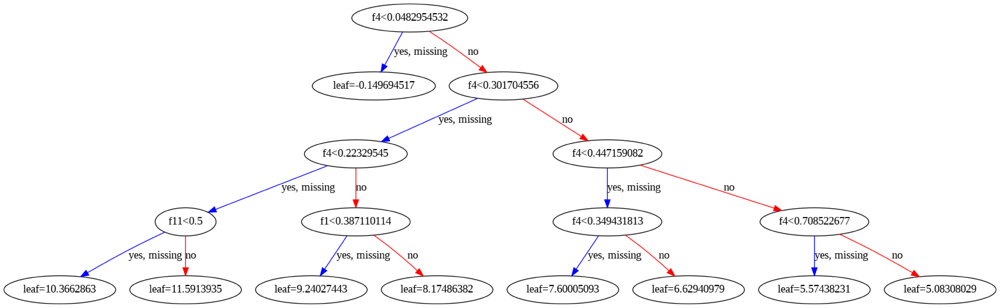

In [ ]:
import matplotlib.pyplot
xgb.plot_tree(xgb_cl, num_trees=0)
fig = matplotlib.pyplot.gcf()
fig.set_size_inches(150, 100)

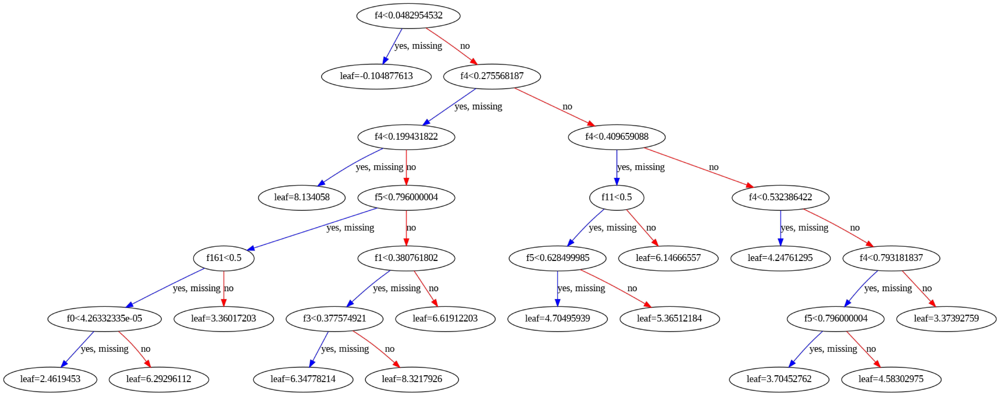

In [ ]:
xgb.plot_tree(xgb_cl, num_trees=1)
fig = matplotlib.pyplot.gcf()
fig.set_size_inches(150, 100)

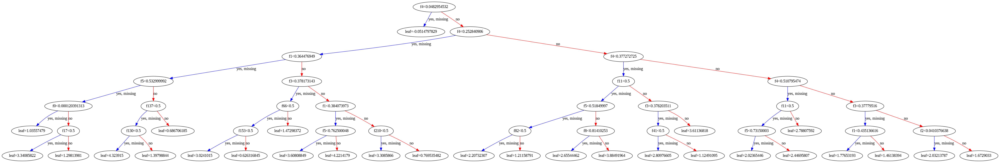

In [ ]:
xgb.plot_tree(xgb_cl, num_trees=3)
fig = matplotlib.pyplot.gcf()
fig.set_size_inches(150, 100)

The XGBoost algorithm was used to plot the first tree, which is shown in the plot above. This plot interprets all nodes (root, leaf, and intermediate). The model's final judgments and the number of splits required to get there are shown in this figure. The root node in the plot shown is "MedianAge." the tree diagrams of the first three trees' node interpretability is shown in tree section.

In [ ]:

explainer = shap.TreeExplainer(xgb_cl)
shap_values = explainer.shap_values(X_train_new,approximate=False, check_additivity=False)

ntree_limit is deprecated, use `iteration_range` or model slicing instead.


# **SHAP Analysis**

From the below SHAP summary diagram, we can interpret a few conclusions -

All the features are listed as per their importance in making the prediction, that is Fertility Rate is more significant followed by Migrants(net), and so on. 

The position on the SHAP value axis indicates the impact the feature has on the prediction either positive or negative. That is, the more the data point is away from the 0.0 shap value - the more its impact is. As we can see Continents has the most impact. The color of the dot represents (Red - High, Blue - Low) the impact of the value on the result. As we can see the distribution of red points in the Continents feature is far more spread than the blue points. From this visual, we can interpret that the MedianAge vastly increases as the amount of Population increases. It doesn't have much impact if the content is low i.e. between the shap value of 0.4 to 0.6 the blue data points are pretty concentrated. Let us analyze the distribution of SHAP values of this feature. As seen in the SHAP plot we can see that extreme values on both ends can have a significant effect on the MedianAge.



No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


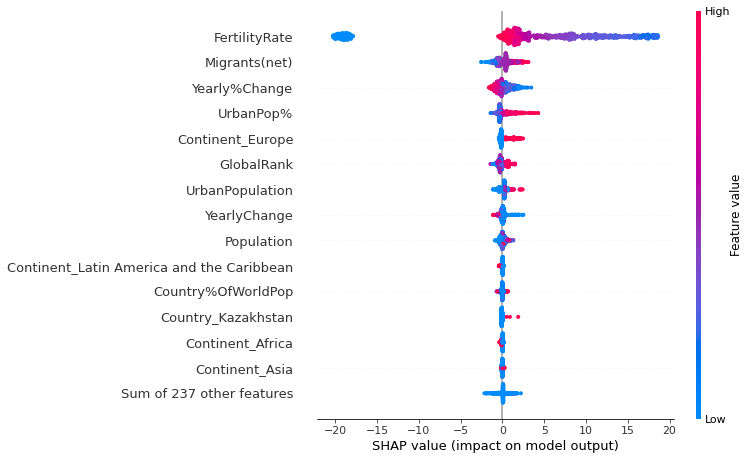

In [ ]:
xgb = shap.Explainer(xgb_cl, X_train)
shap_values_xgb = xgb(X_test_new)
shap.plots.beeswarm(shap_values_xgb, max_display=15)

# **Interpreting SHAP Feature Importance Plot for Tree based model**

The idea behind SHAP feature importance is simple: Features with large absolute Shapley values are important. Since we want global importance, we average the absolute Shapley values per feature across the data. Next, we sort the features by decreasing importance and plot them.

The following plots are

SHAP feature importance for a tree based model


For the tree based model, FertilityRate is most important feature when we consider the average of SHAP values to calculate feature importance.

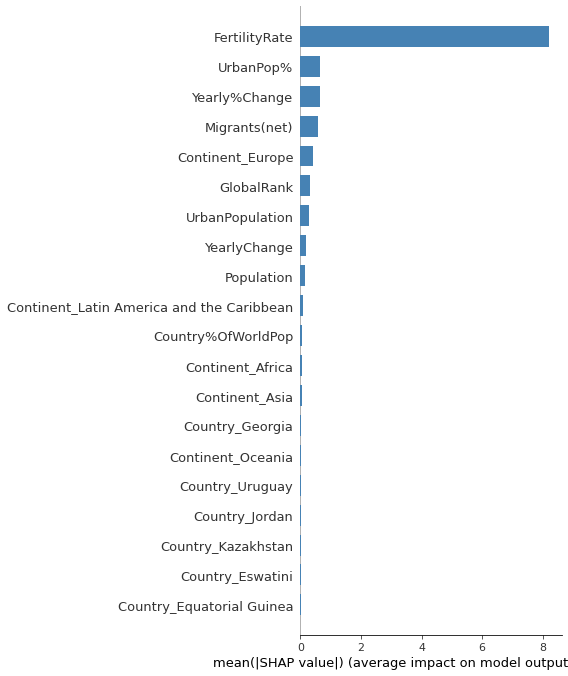

In [ ]:
#shap.summary_plot(shap_values, X_train_new, plot_type = 'bar')
shap.summary_plot(shap_values, X_train_new, plot_type="bar", color='steelblue')

# **Interpreting Waterfall SHAP visualization For Tree Based Model**

Let's consider the same sample (sample_ind = 18)
Notice the value of FertilityRate in the waterfall model is the same as what we have in SHAP partial dependence plot. It says that f(x) = 32.88 .The waterfall model explains how we got the expected output, and which features contributed to what. The below graph shows that FertilityRate has the biggest and most positive impact in increasing the Median Age for this specific sample. Followed by Migrants(net) had a positive impact and GlobalRank had a negative impact on the data which brings the value down. Using this model we can visually interpret why exactly this specific sample is giving an output of 32.888.

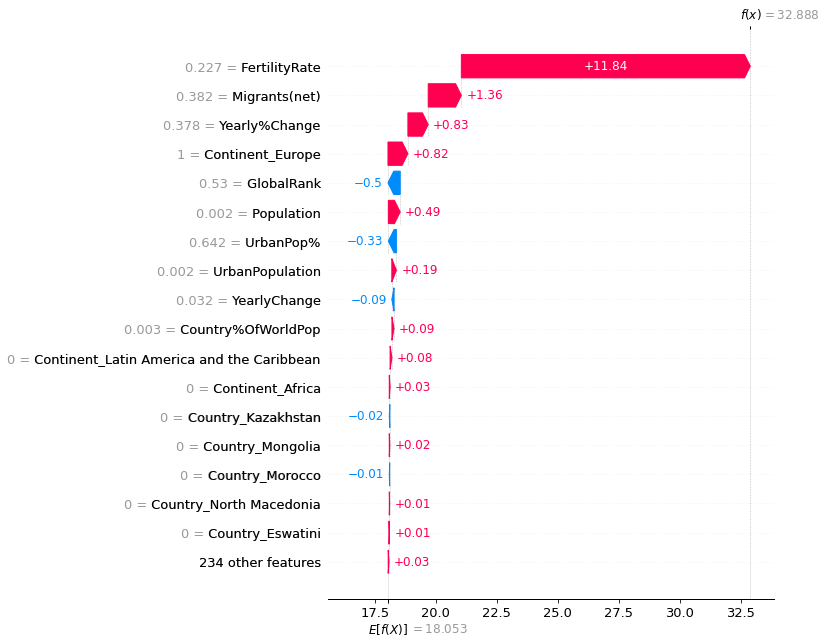

In [ ]:

# Waterfall plot for linear model
sample_ind = 18
shap.plots.waterfall(shap_values_xgb[sample_ind], max_display=18)

# **Partial Dependence Model**

Tree-Based Model - 
 
 On looking at the PDP of the tree-based model, it re-affirms the interpretation we got from the PDP of the Linear Model and Best AutoML model. The only difference here is that the output doesn't vary linearly.

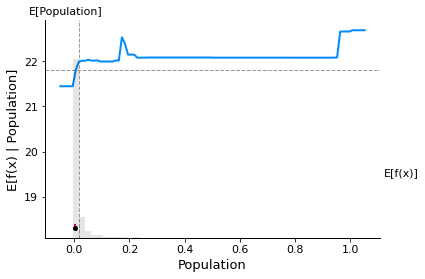

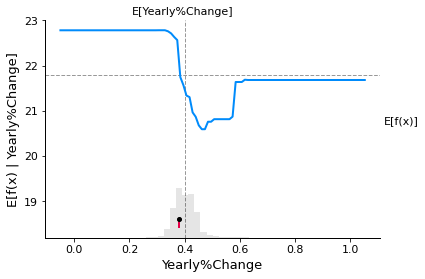

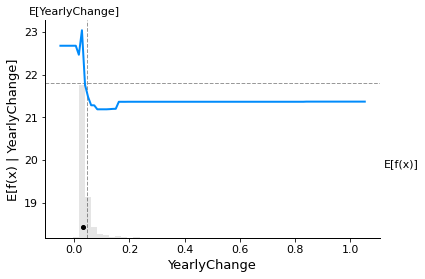

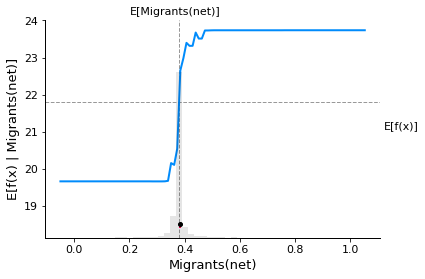

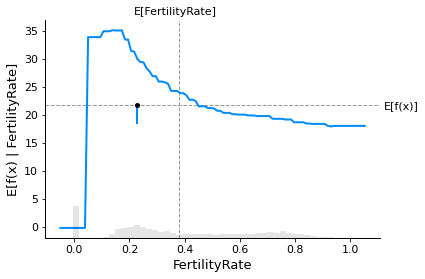

...

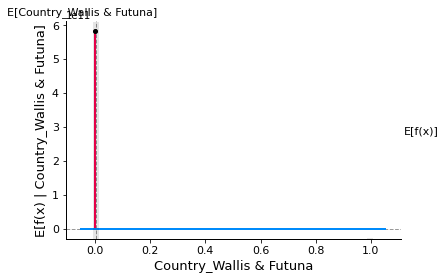

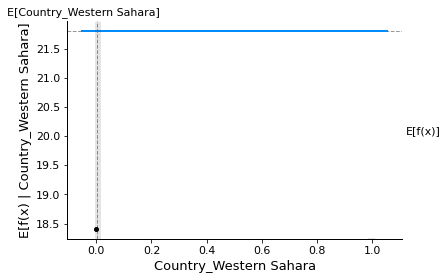

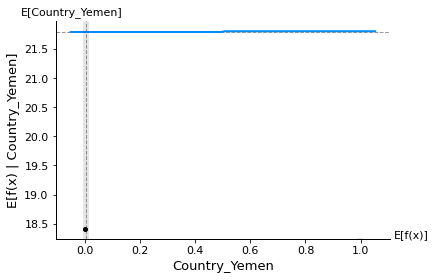

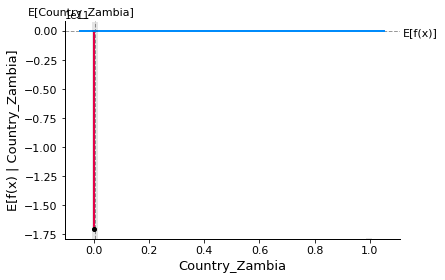

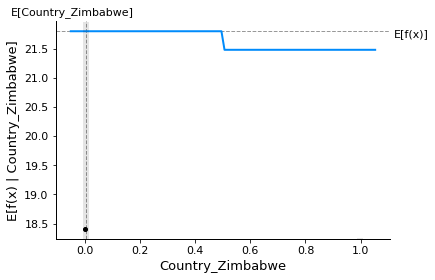

In [ ]:
for i in wp_df1.columns:
    # make a standard partial dependence plot
    sample_ind = 18
    shap.partial_dependence_plot(
        i,
        xgb_cl.predict,
        wp_df1,
        model_expected_value=True,
        feature_expected_value=True,
        ice=False,
        shap_values=shap_values_lg[sample_ind : sample_ind + 1, :],
    )

# **LIME Analysis for Tree Based Model**

**Tree Based Model**

LIME works well on tabular, text, image datasets - hence it works on different datasets

Let us Interpret our Tree Based model on sample data (sample_index = 18) using LIME and try to understand what is happening under the hood. Please refer below for Visualizations of Tree Based model.

As we can see on the left-hand side LIME gives us information about the minimum and maximum values predicted by the model. The Color orange here represents positive and blue represents negative
Here for this sample as seen below Population,FertilityRate, UrbanPop%,Migrants(net)and few countries had a positive effect on the MedianAge in Linear model
Few continents and countires, YearlyChange had a negative effect in the linear model.
These interpretations were carried out locally in the region where of out sample data(sample_index = 18).

In [ ]:
# Initializing LIME explainer for Tree Based Model
lime_tree_explainer = lime_tabular.LimeTabularExplainer(
    training_data=np.array(X_train_new), feature_names=X_train_new.columns, mode="regression"
)
    

In [ ]:
# Getting LIME interpretation for a sample data
idx = 18
np_x_test = np.array(X_test)
np_y_test = np.array(y_test)
print("Prediction : ", xgb_cl.predict(np_x_test[0].reshape(1, -1)))
print("Actual :     ", np_y_test[idx])

lime_tree_explanation = lime_linear_explainer.explain_instance(
    np_x_test[idx], xgb_cl.predict, num_features=np_x_test.shape[1]
)
lime_tree_explanation

Prediction :  [26.130728]
Actual :      34.9


In [ ]:
lime_tree_explanation.show_in_notebook() 

# **AUTOML- Linear Regression**

In [ ]:
# Installing numba library as it is required by pycaret

! pip install numba --upgrade

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
#importing the regression dependencies
from pycaret.regression import *
!pip install --upgrade pycaret

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
# Splitting the data in 80% and 20% data for train and test dataset respectively

from sklearn.model_selection import train_test_split

train,test = train_test_split(wp_df, test_size=0.2, random_state=0)

In [ ]:
model_description = setup(data = train, target = 'MedianAge',feature_selection = True,n_features_to_select=0.50,remove_multicollinearity = True, multicollinearity_threshold = 0.8)

,Description,Value
0,Session id,3649
1,Target,MedianAge
2,Target type,Regression
3,Original data shape,"(3384, 13)"
4,Transformed data shape,"(3384, 7)"
5,Transformed train set shape,"(2368, 7)"
6,Transformed test set shape,"(1016, 7)"
7,Numeric features,10
8,Categorical features,2
9,Preprocess,True


Defining the variables:

target: This argument specifies the target variable (the dependent variable) for the model.

feature_selection: This argument specifies whether to perform feature selection or not. If set to True, the function will perform feature selection and return only the selected features.

feature_selection_threshold: This argument specifies the threshold value for feature selection. It is used to select only those features whose importance scores are greater than or equal to the threshold value.

remove_multicollinearity: This argument specifies whether to remove multicollinearity or not. Multicollinearity refers to the situation when two or more features are highly correlated with each other.

multicollinearity_threshold: This argument specifies the threshold value for multicollinearity. It is used to identify highly correlated features and remove one of them.

silent: This argument specifies whether to display the progress logs or not. If set to True, the function will not display any progress logs.

The setup() function will perform several pre-processing steps on the training dataset such as imputing missing values, encoding categorical variables, scaling numerical variables, etc. Once the pre-processing is completed, the function will return a dictionary object containing various information such as the transformed dataset, feature importance scores, and the selected features. This dictionary object can then be used to train and evaluate machine learning models.

##**Leadership Board for Best Model**

In [ ]:
# Predicting Best Model for AutoML after comparing different models

best_model = compare_models()

,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
lightgbm,Light Gradient Boosting Machine,0.9036,1.8770,1.3604,0.9862,0.0579,0.0419,0.4060
et,Extra Trees Regressor,0.8822,1.9456,1.3852,0.9857,0.0514,0.0411,1.0310
rf,Random Forest Regressor,0.9050,2.0634,1.4303,0.9849,0.0530,0.0423,1.2920
xgboost,Extreme Gradient Boosting,0.9296,2.0835,1.4290,0.9847,0.0625,0.0430,0.7760
gbr,Gradient Boosting Regressor,1.1408,2.7954,1.6574,0.9795,0.0913,0.0514,0.7380
dt,Decision Tree Regressor,1.2099,4.1004,2.0120,0.9701,0.0739,0.0568,0.5080
ada,AdaBoost Regressor,1.5999,4.5431,2.1267,0.9666,0.0827,0.0784,1.0380
br,Bayesian Ridge,2.7143,12.2621,3.4775,0.9103,0.5085,0.1126,0.4940
lar,Least Angle Regression,2.7158,12.2691,3.4784,0.9103,0.5088,0.1127,0.7660
ridge,Ridge Regression,2.7147,12.2640,3.4777,0.9103,0.5087,0.1126,1.0230


Processing:   0%|          | 0/81 [00:00<?, ?it/s]

As seen from the leadership board Light Gradient Boosting Machine(lightgbm) is the best model predicted by Pycaret AutoML. And this Model has been used for making predictions.

In [ ]:
#creating model
lightgbm=create_model('lightgbm')

,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,0.8525,1.4919,1.2214,0.9886,0.0542,0.0401
1,0.8719,1.7418,1.3198,0.9887,0.0579,0.0441
2,0.8600,1.5657,1.2513,0.9882,0.0564,0.0411
3,1.1314,2.7402,1.6554,0.9797,0.0651,0.0482
4,0.8499,1.9499,1.3964,0.9833,0.0633,0.0401
5,0.8323,1.5988,1.2644,0.9894,0.0521,0.0392
6,0.8287,1.6741,1.2939,0.9878,0.0534,0.0397
7,1.0731,2.7877,1.6696,0.9798,0.0742,0.0478
8,0.9062,1.8189,1.3487,0.9865,0.0539,0.0395


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

We see that our linear regression has MSE value of 1.4919 and coefficient of correlation squared (R2) is 98.86%. which is acceptable. R-Squared above 0.7 would generally be seen as showing a high level of correlation.

additionally we have a RMSE value of 1.22

more on--

MSE- https://www.bmc.com/blogs/mean-squared-error-r2-and-variance-in-regression-analysis/

r2 - https://www.investopedia.com/terms/r/r-squared.asp

The LightGBM model that has been tuned and trained on the dataset which has been used here.    

The tune_model() function is a wrapper function from the pycaret.classification module that performs hyperparameter tuning

In [ ]:
# Perform hyperparameter tuning on lgbm model

tuned_lightgbm = tune_model(lightgbm,choose_better = True)

,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,0.8982,1.6912,1.3004,0.9871,0.0744,0.0415
1,0.8701,1.8289,1.3524,0.9882,0.0618,0.0431
2,0.8607,1.5545,1.2468,0.9883,0.0508,0.0414
3,1.1279,2.7188,1.6489,0.9799,0.0585,0.0494
4,0.8710,2.0777,1.4414,0.9822,0.0718,0.0412
5,0.8279,1.6127,1.2699,0.9893,0.0658,0.0391
6,0.8592,1.8626,1.3648,0.9864,0.0614,0.0413
7,1.0605,2.6430,1.6257,0.9808,0.0611,0.0476
8,0.9258,1.9352,1.3911,0.9857,0.0707,0.0393


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits


Original model was better than the tuned model, hence it will be returned. NOTE: The display metrics are for the tuned model (not the original one).


In [ ]:
plot_model(tuned_lightgbm, plot='parameter')

,Parameters
boosting_type,gbdt
class_weight,None
colsample_bytree,1.0
importance_type,split
learning_rate,0.1
max_depth,-1
min_child_samples,20
min_child_weight,0.001
min_split_gain,0.0
n_estimators,100


From the above information we can see the most important hyper parameters used in this model.

In [ ]:
# Generate predictions on new data using a trained machine learning model

predict_model(tuned_lightgbm)

,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,Light Gradient Boosting Machine,0.8082,1.6799,1.2961,0.9881,0.0593,0.0381


,Continent,Country,Year,Population,Yearly%Change,YearlyChange,Migrants(net),FertilityRate,UrbanPop%,UrbanPopulation,Country%OfWorldPop,GlobalRank,MedianAge,prediction_label
478,Africa,Botswana,2005,1799078,1.83,31149,5386,3.19,57.700001,1038238,0.03,147,21.000000,21.267703
660,Northern America,Canada,2015,36026676,1.08,375822,248283,1.60,81.099998,29212401,0.49,37,40.400002,39.819811
341,Europe,Belarus,2020,9449323,-0.03,-3088,8730,1.71,79.199997,7483636,0.12,96,40.299999,40.933131
1244,Latin America and the Caribbean,Falkland Islands,1965,2078,-0.68,-14,0,0.00,53.799999,1119,0.00,232,0.000000,0.172838
717,Africa,Central African Republic,2018,4666368,1.53,70345,-40000,5.03,42.000000,1959587,0.06,126,17.200001,17.588122
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3817,Oceania,Tonga,1960,61577,2.17,1251,-937,7.30,17.600000,10812,0.00,191,17.299999,18.704771
3858,Africa,Tunisia,1985,7329594,2.83,191111,17116,4.82,53.799999,3942049,0.15,80,19.900000,19.791832
3003,Europe,Portugal,2018,10256193,-0.31,-32334,-6000,1.28,65.400002,6710993,0.13,88,44.299999,44.216519
919,Latin America and the Caribbean,Curaçao,1960,126941,1.66,2005,-1197,5.10,74.699997,94838,0.00,173,19.900000,20.021861


We see that our linear regression has MSE value of 1.67 and coefficient of correlation squared (R2) is 98.81%. the closer the value of MSE to 0 the better. R-Squared greater than 0.7 would generally be seen as showing a high level of correlation.

additionally we have a RMSE value of 1.2, where in it can be said that RMSE values between 0.2 and 0.5 shows that the model can relatively predict the data accurately.

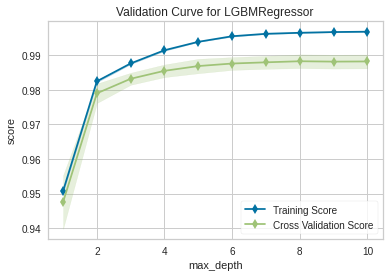

In [ ]:
evaluate_model(tuned_lightgbm)

Before finalizing the model, the plot_model() function can be used to evaluate the performance of the model across different aspects such as Residual Plots, Prediction Error, Feature Importance, etc.

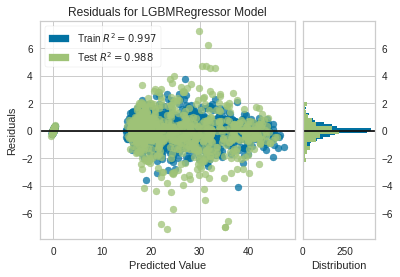

In [ ]:
plot_model(tuned_lightgbm)

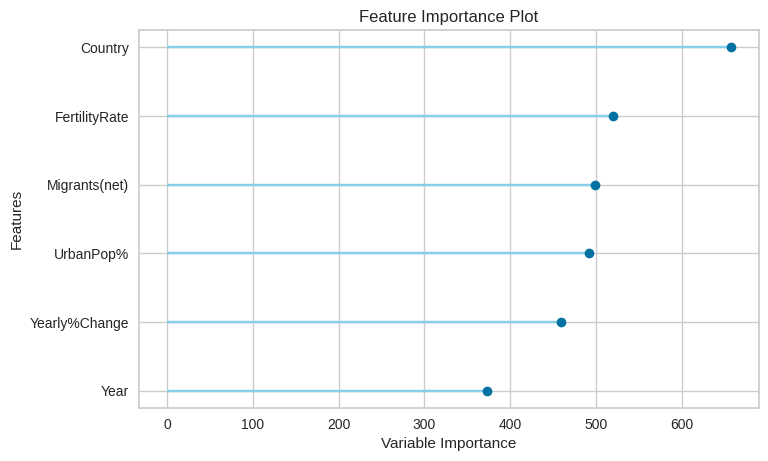

In [ ]:
# Plot variable importance
plot_model(tuned_lightgbm, plot='feature')

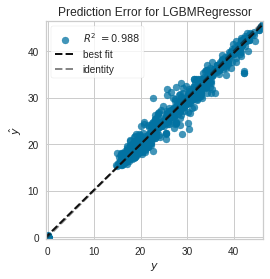

In [ ]:
plot_model(tuned_lightgbm, plot = 'error')

In [ ]:
# Finalizing the tuned lgbm model for final predictions

final_lightgbm = finalize_model(tuned_lightgbm)

In this step we are effectively completing the model building process and obtaining a final version of the model that is ready to make predictions on new data.

In [ ]:
test_predictions = predict_model(final_lightgbm, data=test)

,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,Light Gradient Boosting Machine,0.6582,1.0087,1.0043,0.9925,0.0421,0.0325


After finalizing the Light gradient boosting machine model we see that our linear regression has MSE value of 0.65 and coefficient of correlation squared (R2) is 99.25%. the closer the value of MSE to 0 the better. R-Squared greater than 0.7 would generally be seen as showing a high level of correlation.

additionally we have a RMSE value of 0.69, where in it can be said that RMSE values between 0.2 and 0.7 shows that the model can relatively predict the data accurately

the model performs very well post tuning on data.

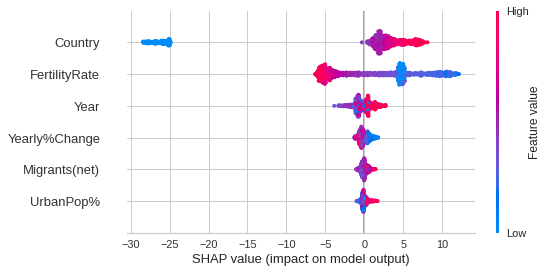

In [ ]:
interpret_model(tuned_lightgbm)

After Intrepreting the AutoML using pycaret we can see that FertilityRate,Year Yearly%Change, Migrants(net) are contributing more towards prediction of the MedianAge.


**Comparision between SHAP, LIME, and Partial Dependence Plot Analysis**

Unlike LIME, SHAP does not necessarily build a local interpretable model but rather uses the black-box model to calculate the marginal contribution to the prediction for each feature and then relies on the theoretically sound game theory concept of Shapley values to calculate the feature importance. In this way, SHAP improves upon LIME due to its greater stability and lack of local linear model assumptions.

PDP gives the extent of effect a variable has on the output by freezing the rest of them

SHAP gives how much each variable contributes to the prediction
LIME is more like SHAP but a lite version of it - It takes the local region of the point of interest and gives us information about the contribution each variable has made to the output
We have to analyze our needs and then consider the tradeoff to select the best suitable interpretable method for the ML model




# **Conclusion**

The Light Gradient Boosting Machine model was selected as the best model for the linear regression method. The Pycaret AutoML functionality helped in performing all the tasks related to one hot encoding and providing the list of best models suited for the dataset. SHAP analysis model, Partial Dependence Plot analysis and LIME analysis helped to understand Funationality of Model Interpretabilty.

# **References:**

For understanding the concepts related to Data science, the following sites and links were used:

Towards Data Science Geeks for Geeks Seaborn: statistical data visualization Machine Learning Mastery Scikit-learn Documentation

Also, referred the notebooks provided by the Professor and Teaching Assistants on Canvas.

https://towardsdatascience.com/explain-your-model-with-the-shap-values-bc36aac4de3d

https://coderzcolumn.com/tutorials/machine-learning/how-to-use-lime-to-understand-sklearn-models-predictions#lime_tabular_ex2

MIT License

Copyright (c) 2023 JeelKanzaria

Permission is hereby granted, free of charge, to any person obtaining a copy of this software and associated documentation files (the "Software"), to deal in the Software without restriction, including without limitation the rights to use, copy, modify, merge, publish, distribute, sublicense, and/or sell copies of the Software, and to permit persons to whom the Software is furnished to do so, subject to the following conditions:

The above copyright notice and this permission notice shall be included in all copies or substantial portions of the Software.

THE SOFTWARE IS PROVIDED "AS IS", WITHOUT WARRANTY OF ANY KIND, EXPRESS OR IMPLIED, INCLUDING BUT NOT LIMITED TO THE WARRANTIES OF MERCHANTABILITY, FITNESS FOR A PARTICULAR PURPOSE AND NONINFRINGEMENT. IN NO EVENT SHALL THE AUTHORS OR COPYRIGHT HOLDERS BE LIABLE FOR ANY CLAIM, DAMAGES OR OTHER LIABILITY, WHETHER IN AN ACTION OF CONTRACT, TORT OR OTHERWISE, ARISING FROM, OUT OF OR IN CONNECTION WITH THE SOFTWARE OR THE USE OR OTHER DEALINGS IN THE SOFTWARE.